In [ ]:
import nltk
import pandas as pd
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn import metrics
import re
import matplotlib.pyplot as plt
from nltk.tokenize import sent_tokenize
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model  import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import csv

d=[]
while(1):
  d.append('1')

## Train test split

## 1. CA vs. US df

In [18]:
ca = pd.read_csv('CA3_.csv',error_bad_lines=False, engine="python")
us = pd.read_csv('US3_.csv',error_bad_lines=False, engine="python")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
Skipping line 11395: unexpected end of data
Skipping line 11405: unexpected end of data


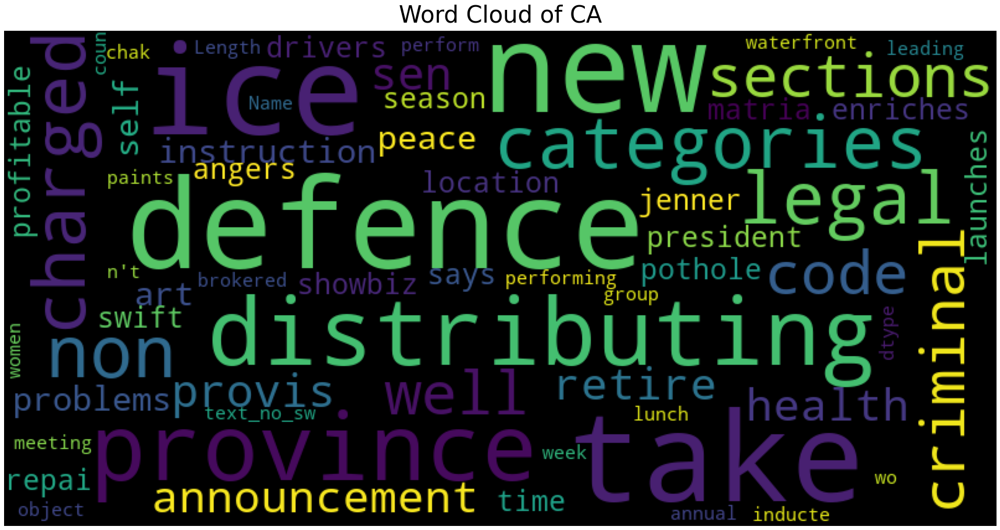

In [ ]:
plot_wordcloud(ca.text_no_sw, title="Word Cloud of CA")

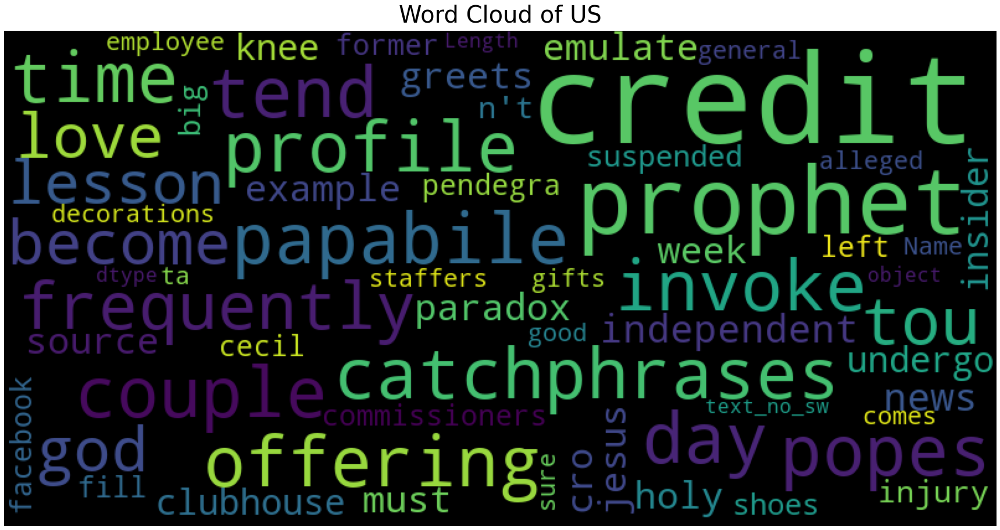

In [ ]:
plot_wordcloud(us.text_no_sw, title="Word Cloud of US")

In [19]:
high_df=ca[['text_no_sw']]
high_df['target']=1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
high_df.isnull().sum()

text_no_sw    0
target        0
dtype: int64

In [20]:
low_df=us[['text_no_sw']]
low_df['target']=0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
low_df.isnull().sum()

text_no_sw    0
target        0
dtype: int64

In [21]:
df=pd.concat([high_df,low_df])
len(df)
#df=df.dropna(subset=['text_no_sw'])

22796

In [ ]:
df.text_no_sw.str.split(expand=True).stack().value_counts().to_excel("freq1.xlsx")

In [22]:
texts=list(df.text_no_sw)
texts = [str(text).replace("<br />"," ") for text in texts]
texts = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts]
level=df.target

In [23]:
texts=[text.lower() for text in texts]

texts=[text.replace("ottawa"," ") for text in texts]
texts=[text.replace("toronto"," ")  for text in texts]
texts=[text.replace("ontario"," ")  for text in texts]

In [24]:
X_dev,X_test,y_dev,y_test=train_test_split(texts,level,
                                          test_size=0.2,random_state=42)

In [25]:
y_dev.value_counts()

0    9141
1    9095
Name: target, dtype: int64

In [26]:
y_test.value_counts()

1    2298
0    2262
Name: target, dtype: int64


porter = PorterStemmer()

def stem(sentence):
    token_words =  word_tokenize(sentence.lower())
    stem_sentence=[porter.stem(word) for word in token_words]
    return  " ".join(stem_sentence)

In [ ]:
len(X_test)

4382

for i in range(len(X_dev)):
    X_dev[i] = stem(X_dev[i])

for i in range(len(X_test)):
    X_test[i] = stem(X_test[i])

X_dev=[text.lower() for text in X_dev]
X_test=[text.lower() for text in X_test]
X_dev=[text.replace("ottawa"," ") for text in X_dev]
X_dev=[text.replace("toronto"," ")  for text in X_dev]
X_test=[text.replace("ottawa"," ") for text in X_test]
X_test=[text.replace("toronto"," ")  for text in X_test]

In [ ]:
#X_dev[1]

In [31]:

vector = TfidfVectorizer()
vector1=vector.fit(X_dev)
dev_X = vector1.transform(X_dev)
test_X =  vector1.transform(X_test)

## 2. SG vs. PH df2

In [27]:
sg = pd.read_csv('SG3_.csv',error_bad_lines=False, engine="python")
ph = pd.read_csv('PH3_.csv',error_bad_lines=False, engine="python")
high_df2=sg[['text_no_sw']]
high_df2['target']=1
low_df2=ph[['text_no_sw']]
low_df2['target']=0

df2=pd.concat([high_df2,low_df2])
print(len(df2))

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
Skipping line 1406: field larger than field limit (131072)
Skipping line 15227: unexpected end of data
Skipping line 14441: unexpected end of data


29663


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df2.text_no_sw.str.split(expand=True).stack().value_counts().to_excel("freq2.xlsx")

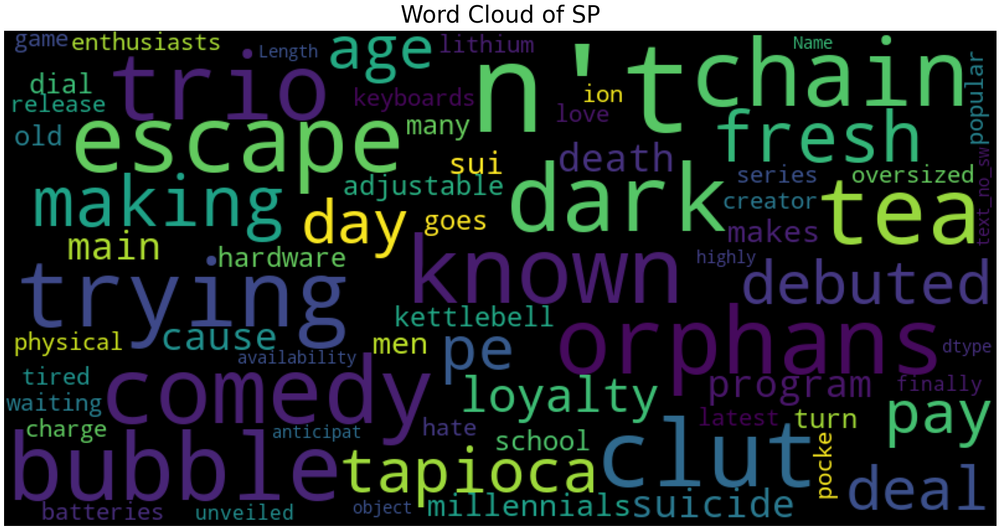

In [ ]:
plot_wordcloud(sg.text_no_sw, title="Word Cloud of SP")

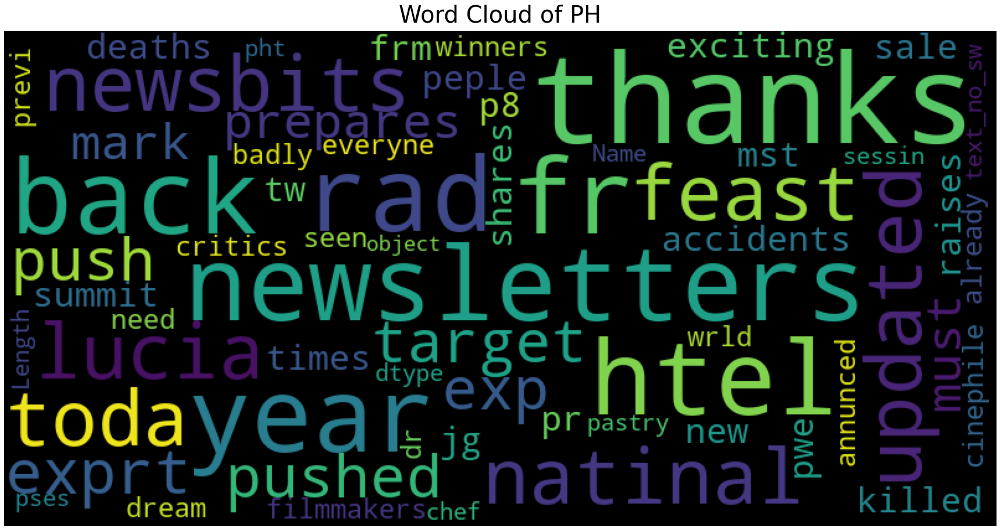

In [ ]:
plot_wordcloud(ph.text_no_sw, title="Word Cloud of PH")

In [48]:

texts2=list(df2.text_no_sw)
texts2 = [str(text).replace("<br />"," ") for text in texts2]
texts2 = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts2]
texts2=[text.lower() for text in texts2]
texts2=[text.replace("singapore"," ") for text in texts2]

level2=df2.target

X_dev2,X_test2,y_dev2,y_test2=train_test_split(texts2,level2,
                                          test_size=0.2,random_state=42)

#for i in range(len(X_dev2)):
#    X_dev2[i] = stem(X_dev2[i])

#for i in range(len(X_test2)):
#    X_test2[i] = stem(X_test2[i])
  

#X_dev2=[text.lower() for text in X_dev2]
#X_test2=[text.lower() for text in X_test2]    
    
vector = TfidfVectorizer()
vector2=vector.fit(X_dev2)
dev_X2 = vector2.transform(X_dev2)
test_X2 =  vector2.transform(X_test2)

In [ ]:
#texts2

## 3. NZ vs. NG df3

In [28]:
nz = pd.read_csv('NZ3_.csv',error_bad_lines=False, engine="python") #1
ng = pd.read_csv('NG3_.csv',error_bad_lines=False, engine="python") #0
high_df3=nz[['text_no_sw']]
high_df3['target']=1
low_df3=ng[['text_no_sw']]
low_df3['target']=0

df3=pd.concat([high_df3,low_df3])
print(len(df3))

texts3=list(df3.text_no_sw)
texts3 = [str(text).replace("<br />"," ") for text in texts3]
texts3 = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts3]
level3=df3.target


/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
Skipping line 13478: unexpected end of data
Skipping line 9411: unexpected end of data
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

22885


In [ ]:
df3.text_no_sw.str.split(expand=True).stack().value_counts().to_excel("freq3.xlsx")

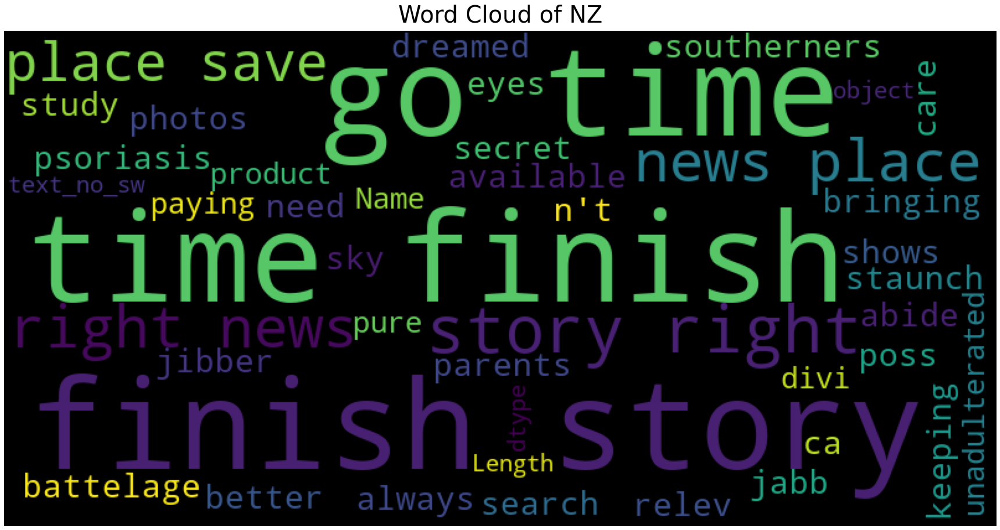

In [ ]:
plot_wordcloud(nz.text_no_sw, title="Word Cloud of NZ")

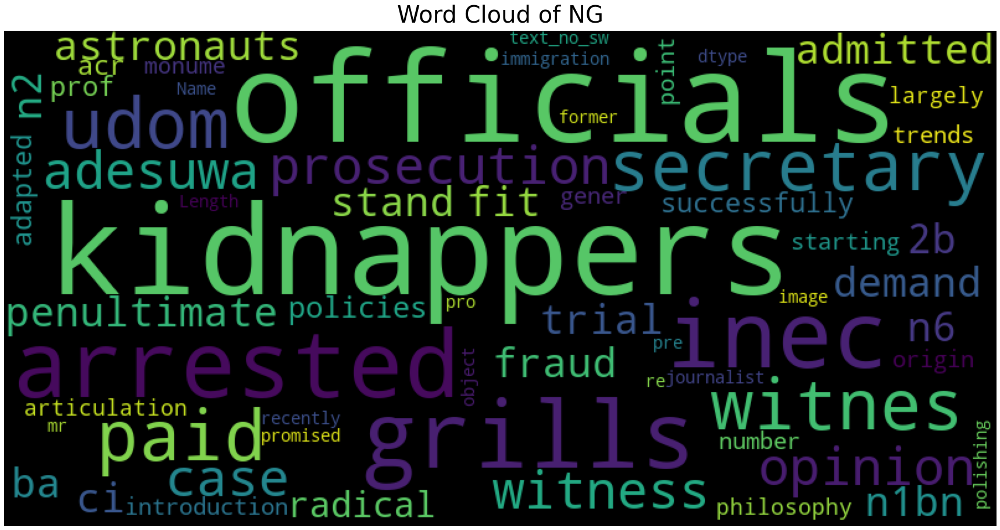

In [ ]:
plot_wordcloud(ng.text_no_sw, title="Word Cloud of NG")

In [49]:

X_dev3,X_test3,y_dev3,y_test3=train_test_split(texts3,level3,
                                          test_size=0.2,random_state=42)

#X_dev3=[stem(dev) for dev in X_dev3]
#X_test3=[stem(test) for test in X_test3]
#for i in range(len(X_dev3)):
#    X_dev3[i] = stem(X_dev3[i])

#for i in range(len(X_test3)):
#    X_test3[i] = stem(X_test3[i])
X_dev3=[text.lower() for text in X_dev3]
X_test3=[text.lower() for text in X_test3]
vector = TfidfVectorizer()
vector3=vector.fit(X_dev3)
dev_X3 = vector3.transform(X_dev3)
test_X3 =  vector3.transform(X_test3)

## 4. IE vs. BD df6

In [29]:
ie = pd.read_csv('IE3_.csv',error_bad_lines=False, engine="python") #1
bd = pd.read_csv('BD3_.csv',error_bad_lines=False, engine="python") #0
high_df6=ie[['text_no_sw']]
high_df6['target']=1
low_df6=bd[['text_no_sw']]
low_df6['target']=0

df6=pd.concat([high_df6,low_df6])
print(len(df6))

texts6=list(df6.text_no_sw)
texts6 = [str(text).replace("<br />"," ") for text in texts6]
texts6 = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts6]
level6=df6.target


/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
Skipping line 14850: unexpected end of data
Skipping line 13964: unexpected end of data
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

28810


In [ ]:
df6.text_no_sw.str.split(expand=True).stack().value_counts().to_excel("freq6.xlsx")

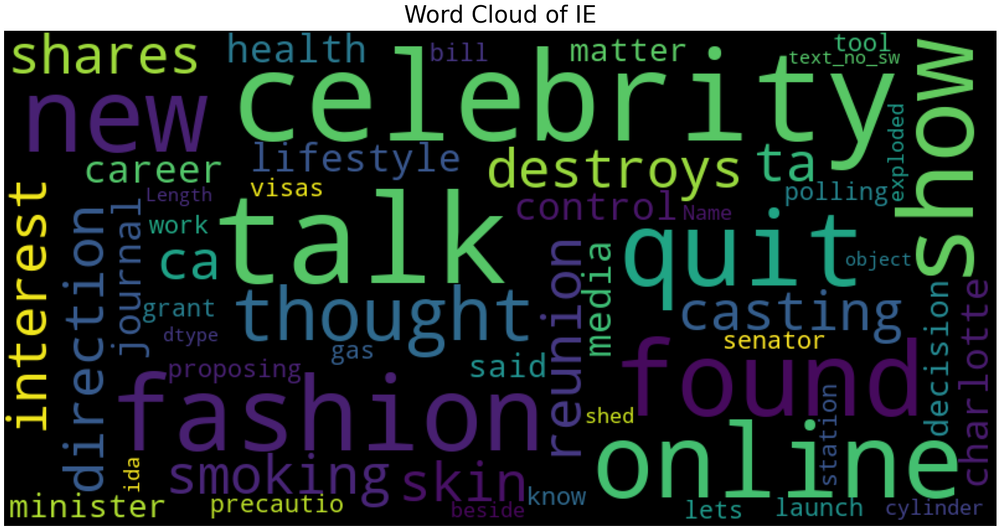

In [ ]:
plot_wordcloud(ie.text_no_sw, title="Word Cloud of IE")

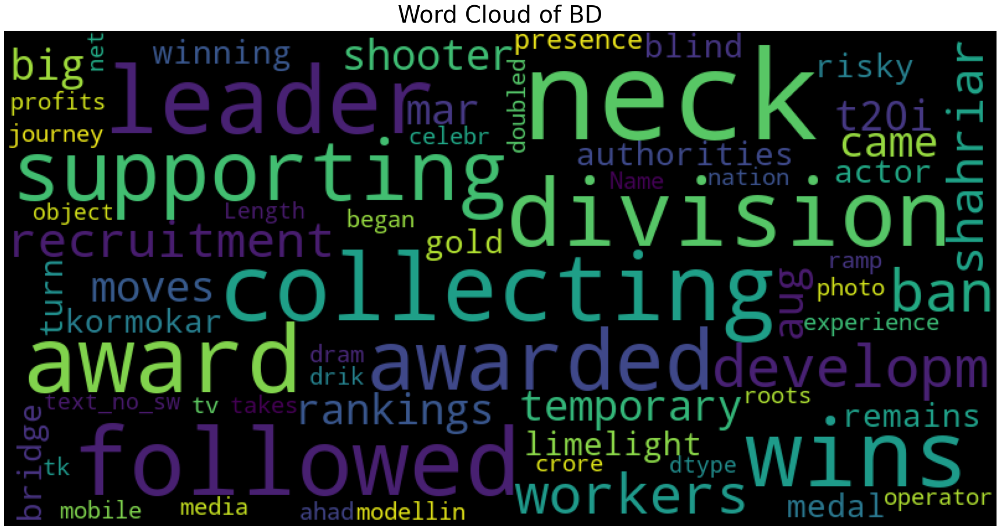

In [ ]:
plot_wordcloud(bd.text_no_sw, title="Word Cloud of BD")

In [50]:

X_dev6,X_test6,y_dev6,y_test6=train_test_split(texts6,level6,
                                          test_size=0.2,random_state=42)

#X_dev6=[stem(dev) for dev in X_dev6]
#X_test6=[stem(test) for test in X_test6]
#for i in range(len(X_dev6)):
#    X_dev6[i] = stem(X_dev6[i])

#for i in range(len(X_test6)):
#    X_test6[i] = stem(X_test6[i])

    
X_dev6=[text.lower() for text in X_dev6]
X_test6=[text.lower() for text in X_test6]    
vector = TfidfVectorizer()
vector6=vector.fit(X_dev6)
dev_X6 = vector6.transform(X_dev6)
test_X6 =  vector6.transform(X_test6)

### Prediction set df,df2,df3,df6

## Eight Countries df7

df7=pd.concat([df,df2,df3,df6])
print(len(df7))

texts7=list(df7.text_2)
texts7 = [text.replace("<br />"," ") for text in texts7]
texts7 = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts7]
level7=df7.target

X_dev7,X_test7,y_dev7,y_test7=train_test_split(texts7,level7,
                                          test_size=0.2,random_state=42)

X_dev7=[stem(dev) for dev in X_dev7]
X_test7=[stem(test) for test in X_test7]
#for i in range(len(X_dev7)):
#    X_dev7[i] = stem(X_dev7[i])

#for i in range(len(X_test7)):
#    X_test7[i] = stem(X_test7[i])
    
vector = TfidfVectorizer()
vetor7=vector.fit(X_dev7)    
dev_X7 = vector7.transform(X_dev7)
test_X7 =  vector7.transform(X_test7)

## CA vs. US dev_X, y_dev

In [ ]:
from wordcloud import WordCloud, STOPWORDS

# Thanks : https://www.kaggle.com/aashita/word-clouds-of-various-shapes ##
def plot_wordcloud(text, mask=None, max_words=200, max_font_size=100, figure_size=(24.0,16.0), 
                   title = None, title_size=40, image_color=False):
    stopwords = set(STOPWORDS)
    more_stopwords = {'one', 'br', 'Po', 'th', 'sayi', 'fo', 'Unknown'}
    stopwords = stopwords.union(more_stopwords)

    wordcloud = WordCloud(background_color='black',
                    stopwords = stopwords,
                    max_words = max_words,
                    max_font_size = max_font_size, 
                    random_state = 42,
                    width=800, 
                    height=400,
                    mask = mask)
    wordcloud.generate(str(text))
    
    plt.figure(figsize=figure_size)
    if image_color:
        image_colors = ImageColorGenerator(mask);
        plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear");
        plt.title(title, fontdict={'size': title_size,  
                                  'verticalalignment': 'bottom'})
    else:
        plt.imshow(wordcloud);
        plt.title(title, fontdict={'size': title_size, 'color': 'black', 
                                  'verticalalignment': 'bottom'})
    plt.axis('off');
    plt.tight_layout()  

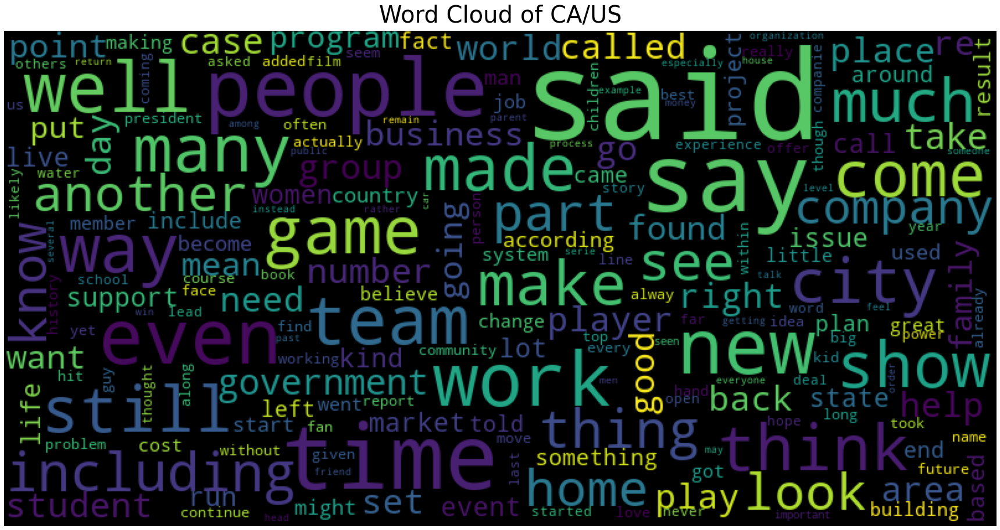

In [ ]:
plot_wordcloud(texts, title="Word Cloud of CA/US")

###  Logistic Regression CV

In [32]:

lr = LogisticRegressionCV().fit(dev_X,y_dev)
scores_lr=cross_val_score(lr,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_lr.mean())
print("Auucuracy score on test data:",lr.score(test_X,y_test))

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


Auucuracy score on test data: 0.8736842105263158


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [ ]:
y_hat_lr = lr.predict(test_X)

cm  = metrics.confusion_matrix(y_test,y_hat_lr)
print(cm)
print(classification_report(y_test,y_hat_lr, digits=4))

[[1997  208]
 [ 333 1844]]
              precision    recall  f1-score   support

           0     0.8571    0.9057    0.8807      2205
           1     0.8986    0.8470    0.8721      2177

    accuracy                         0.8765      4382
   macro avg     0.8779    0.8764    0.8764      4382
weighted avg     0.8777    0.8765    0.8764      4382



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


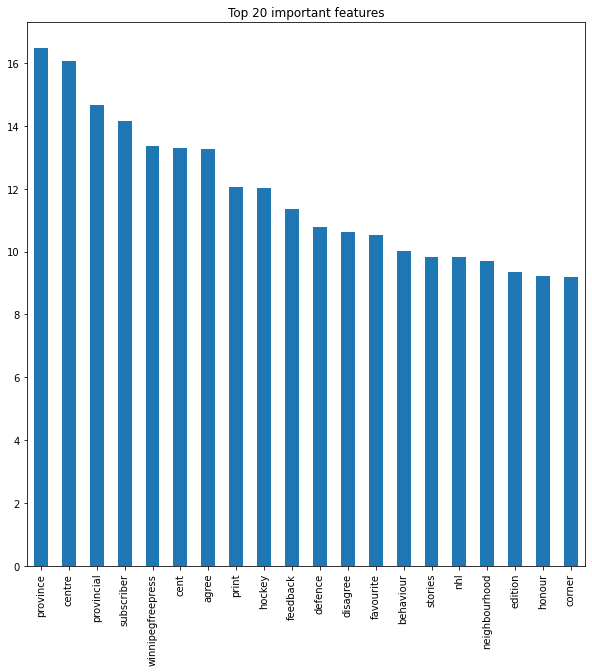

In [ ]:
feat_importances = pd.Series(lr.coef_[0], index=vector1.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance1.xlsx")

## Prediction

In [33]:
#Other countries
#gh=pd.read_csv("GH3.csv",error_bad_lines=False, engine="python")
gb=pd.read_csv("GB3.csv",error_bad_lines=False, engine="python")
au=pd.read_csv("AU3.csv",error_bad_lines=False, engine="python")
ke=pd.read_csv("KE3.csv",error_bad_lines=False, engine="python")
#gh=gh[['text_no_sw','target']]
gb=gb[['text_no_sw','target']]
au=au[['text_no_sw','target']]
ke=ke[['text_no_sw','target']]
df_test=pd.concat([gb,au,ke])

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
Skipping line 12814: field larger than field limit (131072)
Skipping line 14660: unexpected end of data
Skipping line 12665: unexpected end of data
Skipping line 19353: unexpected end of data


In [52]:
## CA:
ca_t=list(high_df.text_no_sw)
ca_t = [str(text).replace("<br />"," ") for text in ca_t]
ca_t = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in ca_t]
ca_t=[text.lower() for text in ca_t]
ca_t=[text.replace("toronto"," ") for text in ca_t]
ca_t=[text.replace("ontario"," ") for text in ca_t]
ca_t=[text.replace("ottawa"," ") for text in ca_t]
ca_level=high_df.target

## US:
us_t=list(low_df.text_no_sw)
us_t = [str(text).replace("<br />"," ") for text in us_t]
us_t = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in us_t]
us_t=[text.lower() for text in us_t]
us_t=[text.replace("toronto"," ") for text in us_t]
us_t=[text.replace("ontario"," ") for text in us_t]
us_t=[text.replace("ottawa"," ") for text in us_t]
us_level=low_df.target

In [34]:
#Prediction
## SG:
sg_t=list(high_df2.text_no_sw)
sg_t = [str(text).replace("<br />"," ") for text in sg_t]
sg_t = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in sg_t]
sg_t=[text.lower() for text in sg_t]
sg_t=[text.replace("singapore"," ") for text in sg_t]
sg_t=[text.replace("zealand"," ") for text in sg_t]
sg_level=high_df2.target

sg_X=vector1.transform(sg_t)
sg_pred_lr = lr.predict(sg_X)

cm  = metrics.confusion_matrix(sg_level,sg_pred_lr)
print(cm)
print(classification_report(sg_level,sg_pred_lr, digits=4))

[[    0     0]
 [10277  4947]]
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.3249    0.4905     15224

    accuracy                         0.3249     15224
   macro avg     0.5000    0.1625    0.2453     15224
weighted avg     1.0000    0.3249    0.4905     15224



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [35]:
## PH
ph_t=list(low_df2.text_no_sw)
ph_t = [str(text).replace("<br />"," ") for text in ph_t]
ph_t = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in ph_t]
ph_t=[text.lower() for text in ph_t]
ph_t=[text.replace("singapore"," ") for text in ph_t]
ph_t=[text.replace("zealand"," ") for text in ph_t]
ph_level=low_df2.target

ph_X=vector1.transform(ph_t)
ph_pred_lr = lr.predict(ph_X)

cm  = metrics.confusion_matrix(ph_level,ph_pred_lr)
print(cm)
print(classification_report(ph_level,ph_pred_lr, digits=4))

[[12352  2087]
 [    0     0]]
              precision    recall  f1-score   support

           0     1.0000    0.8555    0.9221     14439
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.8555     14439
   macro avg     0.5000    0.4277    0.4611     14439
weighted avg     1.0000    0.8555    0.9221     14439



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [36]:
##NZ
nz_t=list(high_df3.text_no_sw)
nz_t = [str(text).replace("<br />"," ") for text in nz_t]
nz_t = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in nz_t]
nz_t=[text.lower() for text in nz_t]
nz_t=[text.replace("singapore"," ") for text in nz_t]
nz_t=[text.replace("zealand"," ") for text in nz_t]
nz_level=high_df3.target

nz_X=vector1.transform(nz_t)
nz_pred_lr = lr.predict(nz_X)

cm  = metrics.confusion_matrix(nz_level,nz_pred_lr)
print(cm)
print(classification_report(nz_level,nz_pred_lr, digits=4))

[[   0    0]
 [6080 7396]]
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.5488    0.7087     13476

    accuracy                         0.5488     13476
   macro avg     0.5000    0.2744    0.3544     13476
weighted avg     1.0000    0.5488    0.7087     13476



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [37]:
##NG
ng_t=list(low_df3.text_no_sw)
ng_t = [str(text).replace("<br />"," ") for text in ng_t]
ng_t = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in ng_t]
ng_t=[text.lower() for text in ng_t]
ng_t=[text.replace("singapore"," ") for text in ng_t]
ng_t=[text.replace("zealand"," ") for text in ng_t]
ng_level=low_df3.target

ng_X=vector1.transform(ng_t)
ng_pred_lr = lr.predict(ng_X)

cm  = metrics.confusion_matrix(ng_level,ng_pred_lr)
print(cm)
print(classification_report(ng_level,ng_pred_lr, digits=4))

[[6754 2655]
 [   0    0]]
              precision    recall  f1-score   support

           0     1.0000    0.7178    0.8357      9409
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.7178      9409
   macro avg     0.5000    0.3589    0.4179      9409
weighted avg     1.0000    0.7178    0.8357      9409



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [38]:
##IE
ie_t=list(high_df6.text_no_sw)
ie_t = [str(text).replace("<br />"," ") for text in ie_t]
ie_t = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in ie_t]
ie_t=[text.lower() for text in ie_t]
ie_t=[text.replace("singapore"," ") for text in ie_t]
ie_t=[text.replace("zealand"," ") for text in ie_t]
ie_level=high_df6.target

ie_X=vector1.transform(ie_t)
ie_pred_lr = lr.predict(ie_X)

cm  = metrics.confusion_matrix(ie_level,ie_pred_lr)
print(cm)
print(classification_report(ie_level,ie_pred_lr, digits=4))

[[   0    0]
 [8030 6818]]
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.4592    0.6294     14848

    accuracy                         0.4592     14848
   macro avg     0.5000    0.2296    0.3147     14848
weighted avg     1.0000    0.4592    0.6294     14848



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [39]:
##BD
bd_t=list(low_df6.text_no_sw)
bd_t = [str(text).replace("<br />"," ") for text in bd_t]
bd_t = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in bd_t]
bd_t=[text.lower() for text in bd_t]
bd_t=[text.replace("singapore"," ") for text in bd_t]
bd_t=[text.replace("zealand"," ") for text in bd_t]
bd_level=low_df6.target

bd_X=vector1.transform(bd_t)
bd_pred_lr = lr.predict(bd_X)

cm  = metrics.confusion_matrix(bd_level,bd_pred_lr)
print(cm)
print(classification_report(bd_level,bd_pred_lr, digits=4))

[[8747 5215]
 [   0    0]]
              precision    recall  f1-score   support

           0     1.0000    0.6265    0.7704     13962
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.6265     13962
   macro avg     0.5000    0.3132    0.3852     13962
weighted avg     1.0000    0.6265    0.7704     13962



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [40]:
##AU
au_t=list(au.text_no_sw)
au_t = [str(text).replace("<br />"," ") for text in au_t]
au_t = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in au_t]
au_t=[text.lower() for text in au_t]
au_t=[text.replace("australia"," ") for text in au_t]
#au_t=[text.replace("zealand"," ") for text in au_t]
au_level=au.target

au_X=vector1.transform(au_t)
au_pred_lr = lr.predict(au_X)

cm  = metrics.confusion_matrix(au_level,au_pred_lr)
print(cm)
print(classification_report(au_level,au_pred_lr, digits=4))

[[   0    0]
 [6549 6114]]
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.4828    0.6512     12663

    accuracy                         0.4828     12663
   macro avg     0.5000    0.2414    0.3256     12663
weighted avg     1.0000    0.4828    0.6512     12663



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [41]:
##KE
ke_t=list(ke.text_no_sw)
ke_t = [str(text).replace("<br />"," ") for text in ke_t]
ke_t = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in ke_t]
ke_t=[text.lower() for text in ke_t]
ke_t=[text.replace("kenya"," ") for text in ke_t]
ke_t=[text.replace("zealand"," ") for text in ke_t]
ke_level=ke.target

ke_X=vector1.transform(ke_t)
ke_pred_lr = lr.predict(ke_X)

cm  = metrics.confusion_matrix(ke_level,ke_pred_lr)
print(cm)
print(classification_report(ke_level,ke_pred_lr, digits=4))

[[12730  6621]
 [    0     0]]
              precision    recall  f1-score   support

           0     1.0000    0.6578    0.7936     19351
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.6578     19351
   macro avg     0.5000    0.3289    0.3968     19351
weighted avg     1.0000    0.6578    0.7936     19351



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [42]:
##GB
gb_t=list(gb.text_no_sw)
gb_t = [str(text).replace("<br />"," ") for text in gb_t]
gb_t = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in gb_t]
gb_t=[text.lower() for text in gb_t]
gb_t=[text.replace("singapore"," ") for text in gb_t]
gb_t=[text.replace("zealand"," ") for text in gb_t]
gb_level=gb.target

gb_X=vector1.transform(gb_t)
gb_pred_lr = lr.predict(gb_X)

cm  = metrics.confusion_matrix(gb_level,gb_pred_lr)
print(cm)
print(classification_report(gb_level,gb_pred_lr, digits=4))

[[   0    0]
 [8728 5929]]
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.4045    0.5760     14657

    accuracy                         0.4045     14657
   macro avg     0.5000    0.2023    0.2880     14657
weighted avg     1.0000    0.4045    0.5760     14657



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
df_test=df_test.dropna(subset=['text_no_sw','target'])

In [ ]:
pred1=pd.concat([df2,df3,df6,df_test])
texts_=list(pred1.text_no_sw)
texts_ = [str(text).replace("<br />"," ") for text in texts_]
texts_ = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts_]
texts_=[text.lower() for text in texts_]
texts_=[text.replace("singapore"," ") for text in texts_]
texts_=[text.replace("zealand"," ") for text in texts_]
level_=pred1.target


_X =  vector1.transform(texts_)   

y_pred_lr = lr.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_lr)
print(cm)
print(classification_report(level_,y_pred_lr, digits=4))

[[35168 17022]
 [42701 35111]]
              precision    recall  f1-score   support

         0.0     0.4516    0.6738    0.5408     52190
         1.0     0.6735    0.4512    0.5404     77812

    accuracy                         0.5406    130002
   macro avg     0.5626    0.5625    0.5406    130002
weighted avg     0.5844    0.5406    0.5406    130002



### Random Forest

In [43]:
rf = RandomForestClassifier().fit(dev_X,y_dev)
#scores_rf=cross_val_score(rf,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_rf.mean())
#print("Auucuracy score on test data:",rf.score(test_X,y_test))

In [ ]:
y_hat_rf = rf.predict(test_X)
cm  = metrics.confusion_matrix(y_test,y_hat_rf)
print(cm)
print(classification_report(y_test,y_hat_rf, digits=4))

[[2068  137]
 [ 504 1673]]
              precision    recall  f1-score   support

           0     0.8040    0.9379    0.8658      2205
           1     0.9243    0.7685    0.8392      2177

    accuracy                         0.8537      4382
   macro avg     0.8642    0.8532    0.8525      4382
weighted avg     0.8638    0.8537    0.8526      4382



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


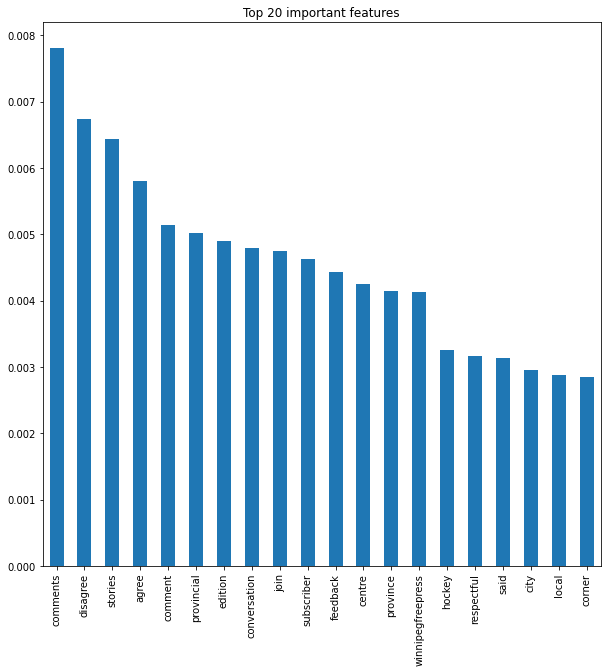

In [ ]:

feat_importances = pd.Series(rf.feature_importances_, index=vector1.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance1_rf.xlsx")

In [45]:
sg_pred_rf = rf.predict(sg_X)

cm  = metrics.confusion_matrix(sg_level,sg_pred_rf)
print(cm)
print("SG:",classification_report(sg_level,sg_pred_rf, digits=4))

ph_pred_rf = rf.predict(ph_X)

cm  = metrics.confusion_matrix(ph_level,ph_pred_rf)
print(cm)
print("PH:",classification_report(ph_level,ph_pred_rf, digits=4))

nz_pred_rf = rf.predict(nz_X)

cm  = metrics.confusion_matrix(nz_level,nz_pred_rf)
print(cm)
print("NZ:",classification_report(nz_level,nz_pred_rf, digits=4))

ng_pred_rf = rf.predict(ng_X)

cm  = metrics.confusion_matrix(ng_level,ng_pred_rf)
print(cm)
print("NG:",classification_report(ng_level,ng_pred_rf, digits=4))

ie_pred_rf = rf.predict(ie_X)

cm  = metrics.confusion_matrix(ie_level,ie_pred_rf)
print(cm)
print(classification_report(ie_level,ie_pred_rf, digits=4))

bd_pred_rf = rf.predict(bd_X)

cm  = metrics.confusion_matrix(bd_level,bd_pred_rf)
print(cm)
print(classification_report(bd_level,bd_pred_rf, digits=4))

[[    0     0]
 [12683  2541]]
SG:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.1669    0.2861     15224

    accuracy                         0.1669     15224
   macro avg     0.5000    0.0835    0.1430     15224
weighted avg     1.0000    0.1669    0.2861     15224



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[14187   252]
 [    0     0]]
PH:               precision    recall  f1-score   support

           0     1.0000    0.9825    0.9912     14439
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9825     14439
   macro avg     0.5000    0.4913    0.4956     14439
weighted avg     1.0000    0.9825    0.9912     14439



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[   0    0]
 [8726 4750]]
NZ:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.3525    0.5212     13476

    accuracy                         0.3525     13476
   macro avg     0.5000    0.1762    0.2606     13476
weighted avg     1.0000    0.3525    0.5212     13476



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[8161 1248]
 [   0    0]]
NG:               precision    recall  f1-score   support

           0     1.0000    0.8674    0.9290      9409
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.8674      9409
   macro avg     0.5000    0.4337    0.4645      9409
weighted avg     1.0000    0.8674    0.9290      9409



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [10629  4219]]
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.2841    0.4425     14848

    accuracy                         0.2841     14848
   macro avg     0.5000    0.1421    0.2213     14848
weighted avg     1.0000    0.2841    0.4425     14848



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[11587  2375]
 [    0     0]]
              precision    recall  f1-score   support

           0     1.0000    0.8299    0.9070     13962
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.8299     13962
   macro avg     0.5000    0.4149    0.4535     13962
weighted avg     1.0000    0.8299    0.9070     13962



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [47]:
au_pred_rf = rf.predict(au_X)

cm  = metrics.confusion_matrix(au_level,au_pred_rf)
print(cm)
print("AU:",classification_report(au_level,au_pred_rf, digits=4))

ke_pred_rf = rf.predict(ke_X)

cm  = metrics.confusion_matrix(ke_level,ke_pred_rf)
print(cm)
print("KE:",classification_report(ke_level,ke_pred_rf, digits=4))

gb_pred_rf = rf.predict(gb_X)

cm  = metrics.confusion_matrix(gb_level,gb_pred_rf)
print(cm)
print("GB:",classification_report(gb_level,gb_pred_rf, digits=4))

[[   0    0]
 [8734 3929]]
AU:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.3103    0.4736     12663

    accuracy                         0.3103     12663
   macro avg     0.5000    0.1551    0.2368     12663
weighted avg     1.0000    0.3103    0.4736     12663



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[15517  3834]
 [    0     0]]
KE:               precision    recall  f1-score   support

           0     1.0000    0.8019    0.8900     19351
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.8019     19351
   macro avg     0.5000    0.4009    0.4450     19351
weighted avg     1.0000    0.8019    0.8900     19351



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [10804  3853]]
GB:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.2629    0.4163     14657

    accuracy                         0.2629     14657
   macro avg     0.5000    0.1314    0.2082     14657
weighted avg     1.0000    0.2629    0.4163     14657



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
y_pred_rf = rf.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_rf)
print(cm)
print(classification_report(level_,y_pred_rf, digits=4))

[[45021  7169]
 [57917 19895]]
              precision    recall  f1-score   support

         0.0     0.4374    0.8626    0.5804     52190
         1.0     0.7351    0.2557    0.3794     77812

    accuracy                         0.4993    130002
   macro avg     0.5862    0.5592    0.4799    130002
weighted avg     0.6156    0.4993    0.4601    130002



def vectorize(data,tfidf_vect_fit):
    X_tfidf = tfidf_vect_fit.transform(data)
    words = tfidf_vect_fit.get_feature_names()
    X_tfidf_df = pd.DataFrame(X_tfidf.toarray())
    X_tfidf_df.columns = words
    return(X_tfidf_df)


### SVM

from sklearn.svm import LinearSVC, SVC


svc = SVC().fit(dev_X,y_dev)
#scores_svc=cross_val_score(svc,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_svc.mean())
print("Auucuracy score on test data:",svc.score(test_X,y_test))

y_hat = svc.predict(test_X)
cm  = metrics.confusion_matrix(y_test,y_hat)
print(cm)
print(classification_report(y_test,y_hat, digits=4))

### XGB

In [ ]:

xgb_cl = xgb.XGBClassifier().fit(dev_X,y_dev)
#scores_xgb=cross_val_score(xgb_cl,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_xgb.mean())
print("Auucuracy score on test data:",xgb_cl.score(test_X,y_test))

Auucuracy score on test data: 0.8261068005476951


In [ ]:
y_hat_xgb = xgb_cl.predict(test_X)
cm  = metrics.confusion_matrix(y_test,y_hat_xgb)
print(cm)
print(classification_report(y_test,y_hat_xgb, digits=4))

[[2112   93]
 [ 669 1508]]
              precision    recall  f1-score   support

           0     0.7594    0.9578    0.8472      2205
           1     0.9419    0.6927    0.7983      2177

    accuracy                         0.8261      4382
   macro avg     0.8507    0.8253    0.8227      4382
weighted avg     0.8501    0.8261    0.8229      4382



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


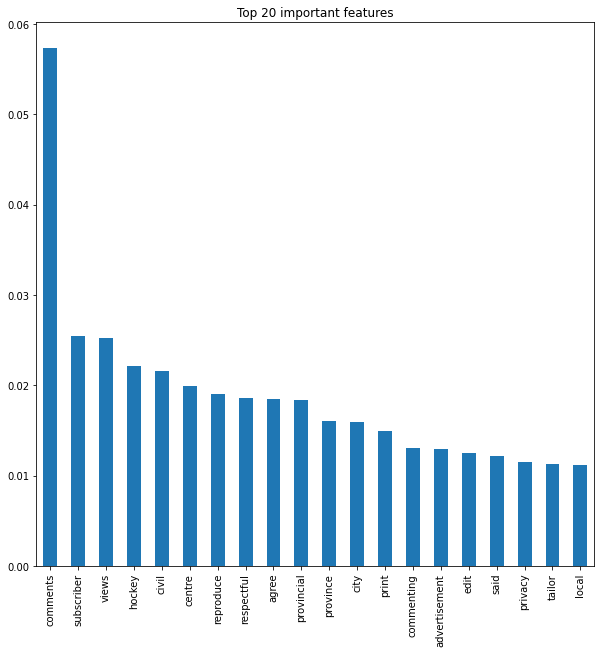

In [ ]:
feat_importances = pd.Series(xgb_cl.feature_importances_, index=vector1.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance1_xgb.xlsx")

In [ ]:
y_pred_xgb = xgb_cl.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_xgb)
print(cm)
print(classification_report(level_,y_pred_xgb, digits=4))

[[45633  6557]
 [60491 17321]]
              precision    recall  f1-score   support

         0.0     0.4300    0.8744    0.5765     52190
         1.0     0.7254    0.2226    0.3407     77812

    accuracy                         0.4843    130002
   macro avg     0.5777    0.5485    0.4586    130002
weighted avg     0.6068    0.4843    0.4353    130002



## SG vs. PH dev_X2, y_dev2

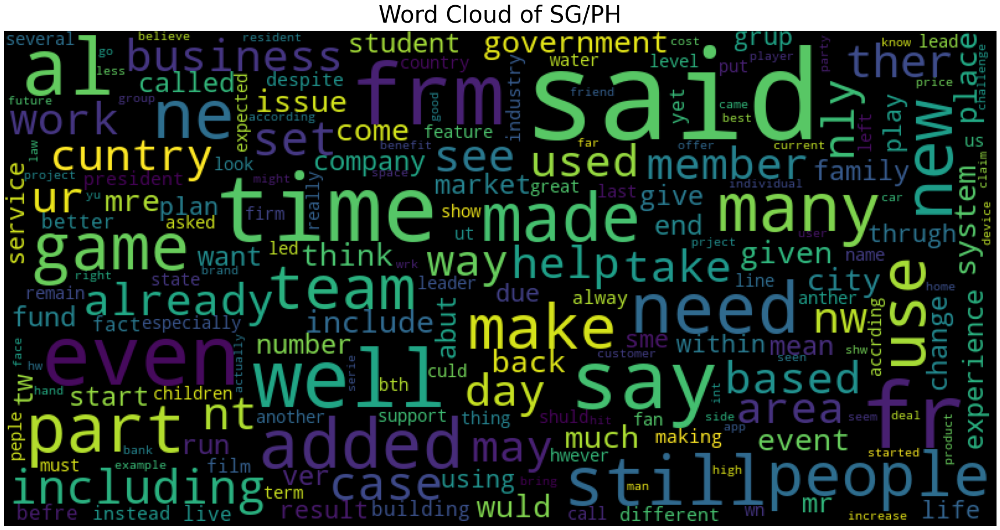

In [ ]:
plot_wordcloud(texts2, title="Word Cloud of SG/PH")

### Logistic Regression

In [51]:
lr2 = LogisticRegressionCV().fit(dev_X2,y_dev2)
#scores_lr2=cross_val_score(lr2,dev_X2,y_dev2,cv=3)
#print("Auucuracy score on development data:",scores_lr2.mean())
print("Auucuracy score on test data:",lr2.score(test_X2,y_test2))

Auucuracy score on test data: 1.0


In [ ]:
y_hat_lr2 = lr2.predict(test_X2)

cm  = metrics.confusion_matrix(y_test2,y_hat_lr2)
print(cm)
print(classification_report(y_test2,y_hat_lr2, digits=4))

[[2652    1]
 [   0 2745]]
              precision    recall  f1-score   support

           0     1.0000    0.9996    0.9998      2653
           1     0.9996    1.0000    0.9998      2745

    accuracy                         0.9998      5398
   macro avg     0.9998    0.9998    0.9998      5398
weighted avg     0.9998    0.9998    0.9998      5398



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


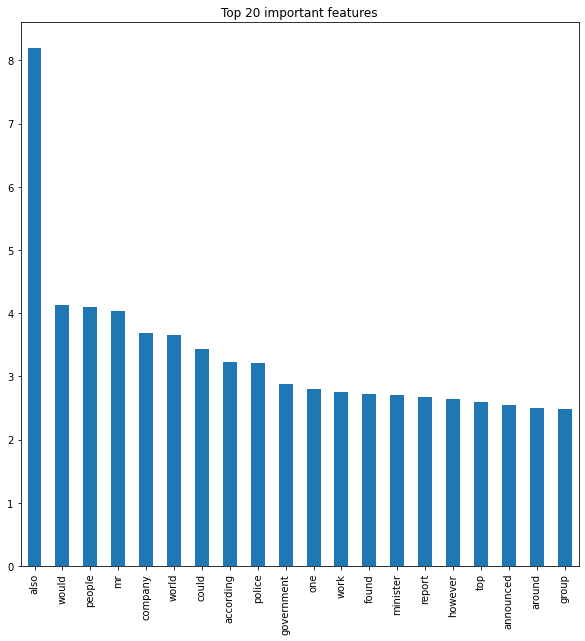

In [ ]:
feat_importances = pd.Series(lr2.coef_[0], index=vector2.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance2_lr.xlsx")

## Prediction

In [53]:
ca_X=vector2.transform(ca_t)
ca_pred_lr = lr2.predict(ca_X)

cm  = metrics.confusion_matrix(ca_level,ca_pred_lr)
print(cm)
print("CA:",classification_report(ca_level,ca_pred_lr, digits=4))

us_X=vector2.transform(us_t)
us_pred_lr = lr2.predict(us_X)

cm  = metrics.confusion_matrix(us_level,us_pred_lr)
print(cm)
print("US:",classification_report(us_level,us_pred_lr, digits=4))

#sg_X=vector1.transform(sg_t)
#sg_pred_lr = lr.predict(sg_X)

#cm  = metrics.confusion_matrix(sg_level,sg_pred_lr)
#print(cm)
#print(classification_report(sg_level,sg_pred_lr, digits=4))

#ph_X=vector1.transform(ph_t)
#ph_pred_lr = lr.predict(ph_X)

#cm  = metrics.confusion_matrix(ph_level,ph_pred_lr)
#print(cm)
#print(classification_report(ph_level,ph_pred_lr, digits=4))

nz_X=vector2.transform(nz_t)
nz_pred_lr = lr2.predict(nz_X)

cm  = metrics.confusion_matrix(nz_level,nz_pred_lr)
print(cm)
print("NZ:",classification_report(nz_level,nz_pred_lr, digits=4))

ng_X=vector2.transform(ng_t)
ng_pred_lr = lr2.predict(ng_X)

cm  = metrics.confusion_matrix(ng_level,ng_pred_lr)
print(cm)
print("NG:",classification_report(ng_level,ng_pred_lr, digits=4))

ie_X=vector2.transform(ie_t)
ie_pred_lr = lr2.predict(ie_X)

cm  = metrics.confusion_matrix(ie_level,ie_pred_lr)
print(cm)
print("IE:",classification_report(ie_level,ie_pred_lr, digits=4))

bd_X=vector2.transform(bd_t)
bd_pred_lr = lr2.predict(bd_X)

cm  = metrics.confusion_matrix(bd_level,bd_pred_lr)
print(cm)
print("BD:",classification_report(bd_level,bd_pred_lr, digits=4))

au_X=vector2.transform(au_t)
au_pred_lr = lr2.predict(au_X)

cm  = metrics.confusion_matrix(au_level,au_pred_lr)
print(cm)
print("AU:",classification_report(au_level,au_pred_lr, digits=4))

ke_X=vector2.transform(ke_t)
ke_pred_lr = lr2.predict(ke_X)

cm  = metrics.confusion_matrix(ke_level,ke_pred_lr)
print(cm)
print("KE:",classification_report(ke_level,ke_pred_lr, digits=4))

gb_X=vector2.transform(gb_t)
gb_pred_lr = lr2.predict(gb_X)

cm  = metrics.confusion_matrix(gb_level,gb_pred_lr)
print(cm)
print("GB:",classification_report(gb_level,gb_pred_lr, digits=4))


[[11393]]
CA:               precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000     11393

    accuracy                         1.0000     11393
   macro avg     1.0000    1.0000    1.0000     11393
weighted avg     1.0000    1.0000    1.0000     11393

[[    0 11403]
 [    0     0]]
US:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000   11403.0
           1     0.0000    0.0000    0.0000       0.0

    accuracy                         0.0000   11403.0
   macro avg     0.0000    0.0000    0.0000   11403.0
weighted avg     0.0000    0.0000    0.0000   11403.0



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1

[[13476]]
NZ:               precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000     13476

    accuracy                         1.0000     13476
   macro avg     1.0000    1.0000    1.0000     13476
weighted avg     1.0000    1.0000    1.0000     13476

[[   0 9409]
 [   0    0]]
NG:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000    9409.0
           1     0.0000    0.0000    0.0000       0.0

    accuracy                         0.0000    9409.0
   macro avg     0.0000    0.0000    0.0000    9409.0
weighted avg     0.0000    0.0000    0.0000    9409.0



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1

[[    0     0]
 [  261 14587]]
IE:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9824    0.9911     14848

    accuracy                         0.9824     14848
   macro avg     0.5000    0.4912    0.4956     14848
weighted avg     1.0000    0.9824    0.9911     14848



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0 13962]
 [    0     0]]
BD:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000   13962.0
           1     0.0000    0.0000    0.0000       0.0

    accuracy                         0.0000   13962.0
   macro avg     0.0000    0.0000    0.0000   13962.0
weighted avg     0.0000    0.0000    0.0000   13962.0



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1

[[    0     0]
 [    1 12662]]
AU:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9999    1.0000     12663

    accuracy                         0.9999     12663
   macro avg     0.5000    0.5000    0.5000     12663
weighted avg     1.0000    0.9999    1.0000     12663



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0 19351]
 [    0     0]]
KE:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000   19351.0
           1     0.0000    0.0000    0.0000       0.0

    accuracy                         0.0000   19351.0
   macro avg     0.0000    0.0000    0.0000   19351.0
weighted avg     0.0000    0.0000    0.0000   19351.0



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1

[[14657]]
GB:               precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000     14657

    accuracy                         1.0000     14657
   macro avg     1.0000    1.0000    1.0000     14657
weighted avg     1.0000    1.0000    1.0000     14657



In [ ]:
pred2=pd.concat([df,df3,df6,df_test])
texts_=list(pred2.text_no_sw)
texts_ = [str(text).replace("<br />"," ") for text in texts_]
texts_ = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts_]
texts_ =[text.lower() for text in texts_]
texts_=[text.replace("ottawa"," ") for text in texts_]
texts_=[text.replace("toronto"," ")  for text in texts_]
texts_=[text.replace("ontario"," ")  for text in texts_]
texts_=[text.replace("zealand"," ")  for text in texts_]
level_=pred2.target


_X =  vector2.transform(texts_ )   

y_pred_lr = lr2.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_lr)
print(cm)
print(classification_report(level_,y_pred_lr, digits=4))

[[    0 49980]
 [  250 74689]]
              precision    recall  f1-score   support

         0.0     0.0000    0.0000    0.0000     49980
         1.0     0.5991    0.9967    0.7484     74939

    accuracy                         0.5979    124919
   macro avg     0.2995    0.4983    0.3742    124919
weighted avg     0.3594    0.5979    0.4489    124919



### Random Forest

In [54]:
rf2 = RandomForestClassifier().fit(dev_X2,y_dev2)
#scores_rf=cross_val_score(rf,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_rf.mean())
print("Auucuracy score on test data:",rf2.score(test_X2,y_test2))

Auucuracy score on test data: 1.0


In [ ]:
y_hat_rf2 = rf2.predict(test_X2)
cm  = metrics.confusion_matrix(y_test2,y_hat_rf2)
print(cm)
print(classification_report(y_test2,y_hat_rf2, digits=4))

[[2653    0]
 [   0 2745]]
              precision    recall  f1-score   support

           0     1.0000    1.0000    1.0000      2653
           1     1.0000    1.0000    1.0000      2745

    accuracy                         1.0000      5398
   macro avg     1.0000    1.0000    1.0000      5398
weighted avg     1.0000    1.0000    1.0000      5398



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


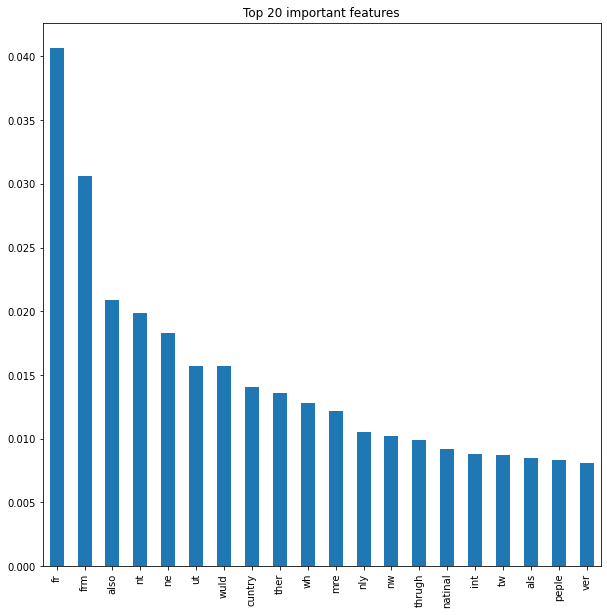

In [ ]:
feat_importances = pd.Series(rf2.feature_importances_, index=vector2.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance2_rf.xlsx")

In [55]:
#ca_X=vector2.transform(ca_t)
ca_pred_rf = rf2.predict(ca_X)

cm  = metrics.confusion_matrix(ca_level,ca_pred_rf)
print(cm)
print("CA:",classification_report(ca_level,ca_pred_rf, digits=4))

#us_X=vector2.transform(us_t)
us_pred_rf = rf2.predict(us_X)

cm  = metrics.confusion_matrix(us_level,us_pred_rf)
print(cm)
print("US:",classification_report(us_level,us_pred_rf, digits=4))

#sg_X=vector1.transform(sg_t)
#sg_pred_lr = lr.predict(sg_X)

#cm  = metrics.confusion_matrix(sg_level,sg_pred_lr)
#print(cm)
#print(classification_report(sg_level,sg_pred_lr, digits=4))

#ph_X=vector1.transform(ph_t)
#ph_pred_lr = lr.predict(ph_X)

#cm  = metrics.confusion_matrix(ph_level,ph_pred_lr)
#print(cm)
#print(classification_report(ph_level,ph_pred_lr, digits=4))

#nz_X=vector2.transform(nz_t)
nz_pred_rf = rf2.predict(nz_X)

cm  = metrics.confusion_matrix(nz_level,nz_pred_rf)
print(cm)
print("NZ:",classification_report(nz_level,nz_pred_rf, digits=4))

#ng_X=vector2.transform(ng_t)
ng_pred_rf = rf2.predict(ng_X)

cm  = metrics.confusion_matrix(ng_level,ng_pred_rf)
print(cm)
print("NG:",classification_report(ng_level,ng_pred_rf, digits=4))

#ie_X=vector2.transform(ie_t)
ie_pred_rf = rf2.predict(ie_X)

cm  = metrics.confusion_matrix(ie_level,ie_pred_rf)
print(cm)
print("IE:",classification_report(ie_level,ie_pred_rf, digits=4))

#bd_X=vector2.transform(bd_t)
bd_pred_rf = rf2.predict(bd_X)

cm  = metrics.confusion_matrix(bd_level,bd_pred_rf)
print(cm)
print("BD:",classification_report(bd_level,bd_pred_rf, digits=4))

#au_X=vector2.transform(au_t)
au_pred_rf = rf2.predict(au_X)

cm  = metrics.confusion_matrix(au_level,au_pred_rf)
print(cm)
print("AU:",classification_report(au_level,au_pred_rf, digits=4))

#ke_X=vector2.transform(ke_t)
ke_pred_rf = rf2.predict(ke_X)

cm  = metrics.confusion_matrix(ke_level,ke_pred_rf)
print(cm)
print("KE:",classification_report(ke_level,ke_pred_rf, digits=4))

#gb_X=vector2.transform(gb_t)
gb_pred_rf = rf2.predict(gb_X)

cm  = metrics.confusion_matrix(gb_level,gb_pred_rf)
print(cm)
print("GB:",classification_report(gb_level,gb_pred_rf, digits=4))


[[11393]]
CA:               precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000     11393

    accuracy                         1.0000     11393
   macro avg     1.0000    1.0000    1.0000     11393
weighted avg     1.0000    1.0000    1.0000     11393

[[    2 11401]
 [    0     0]]
US:               precision    recall  f1-score   support

           0     1.0000    0.0002    0.0004     11403
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.0002     11403
   macro avg     0.5000    0.0001    0.0002     11403
weighted avg     1.0000    0.0002    0.0004     11403



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[13476]]
NZ:               precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000     13476

    accuracy                         1.0000     13476
   macro avg     1.0000    1.0000    1.0000     13476
weighted avg     1.0000    1.0000    1.0000     13476

[[   1 9408]
 [   0    0]]
NG:               precision    recall  f1-score   support

           0     1.0000    0.0001    0.0002      9409
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.0001      9409
   macro avg     0.5000    0.0001    0.0001      9409
weighted avg     1.0000    0.0001    0.0002      9409



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [  996 13852]]
IE:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9329    0.9653     14848

    accuracy                         0.9329     14848
   macro avg     0.5000    0.4665    0.4826     14848
weighted avg     1.0000    0.9329    0.9653     14848



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    1 13961]
 [    0     0]]
BD:               precision    recall  f1-score   support

           0     1.0000    0.0001    0.0001     13962
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.0001     13962
   macro avg     0.5000    0.0000    0.0001     13962
weighted avg     1.0000    0.0001    0.0001     13962



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[12663]]
AU:               precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000     12663

    accuracy                         1.0000     12663
   macro avg     1.0000    1.0000    1.0000     12663
weighted avg     1.0000    1.0000    1.0000     12663

[[    0 19351]
 [    0     0]]
KE:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000   19351.0
           1     0.0000    0.0000    0.0000       0.0

    accuracy                         0.0000   19351.0
   macro avg     0.0000    0.0000    0.0000   19351.0
weighted avg     0.0000    0.0000    0.0000   19351.0



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1

[[14657]]
GB:               precision    recall  f1-score   support

           1     1.0000    1.0000    1.0000     14657

    accuracy                         1.0000     14657
   macro avg     1.0000    1.0000    1.0000     14657
weighted avg     1.0000    1.0000    1.0000     14657



In [ ]:
y_pred_rf = rf2.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_rf)
print(cm)
print(classification_report(level_,y_pred_rf, digits=4))

[[    1 49979]
 [  249 74690]]
              precision    recall  f1-score   support

         0.0     0.0040    0.0000    0.0000     49980
         1.0     0.5991    0.9967    0.7484     74939

    accuracy                         0.5979    124919
   macro avg     0.3016    0.4983    0.3742    124919
weighted avg     0.3610    0.5979    0.4490    124919



### XGB

In [ ]:
xgb_cl2 = xgb.XGBClassifier().fit(dev_X2,y_dev2)
#scores_xgb=cross_val_score(xgb_cl,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_xgb.mean())
print("Auucuracy score on test data:",xgb_cl2.score(test_X2,y_test2))

y_hat_xgb2 = xgb_cl2.predict(test_X2)
cm  = metrics.confusion_matrix(y_test2,y_hat_xgb2)
print(cm)
print(classification_report(y_test2,y_hat_xgb2, digits=4))

Auucuracy score on test data: 0.9977769544275658
[[2641   12]
 [   0 2745]]
              precision    recall  f1-score   support

           0     1.0000    0.9955    0.9977      2653
           1     0.9956    1.0000    0.9978      2745

    accuracy                         0.9978      5398
   macro avg     0.9978    0.9977    0.9978      5398
weighted avg     0.9978    0.9978    0.9978      5398



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


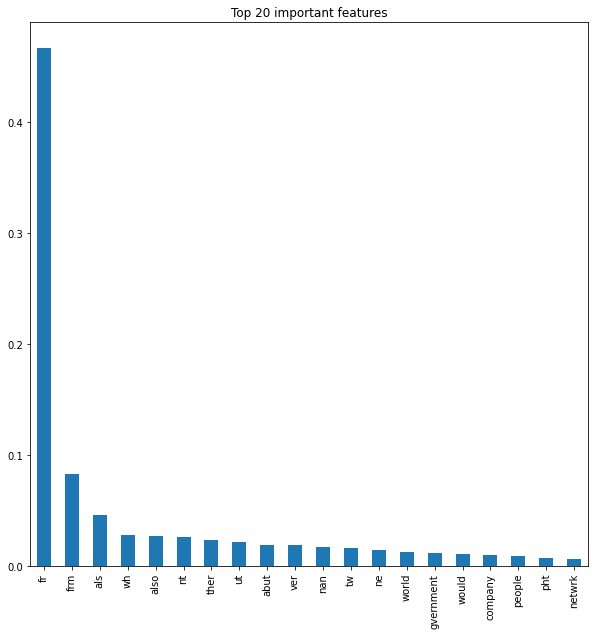

In [ ]:
feat_importances = pd.Series(xgb_cl2.feature_importances_, index=vector2.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance2_xgb.xlsx")

In [ ]:
y_pred_xgb = xgb_cl2.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_xgb)
print(cm)
print(classification_report(level_,y_pred_xgb, digits=4))

[[   33 49947]
 [  536 74403]]
              precision    recall  f1-score   support

         0.0     0.0580    0.0007    0.0013     49980
         1.0     0.5983    0.9928    0.7467     74939

    accuracy                         0.5959    124919
   macro avg     0.3282    0.4968    0.3740    124919
weighted avg     0.3821    0.5959    0.4485    124919



### SVM

svc = SVC().fit(dev_X,y_dev)
#scores_svc=cross_val_score(svc,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_svc.mean())
print("Auucuracy score on test data:",svc.score(test_X,y_test))

y_hat = svc.predict(test_X)
cm  = metrics.confusion_matrix(y_test,y_hat)
print(cm)
print(classification_report(y_test,y_hat, digits=4))

##  Four Countries

df3=pd.concat([df,df2])
texts=list(df3.text_2)
texts = [text.replace("<br />"," ") for text in texts]
level=df3.target

X_dev,X_test,y_dev,y_test=train_test_split(texts,level,
                                          test_size=0.2,random_state=42)

for i in range(len(X_dev)):
    X_dev[i] = stem(X_dev[i])

for i in range(len(X_test)):
    X_test[i] = stem(X_test[i])

dev_X = vector.fit_transform(X_dev)
test_X =  vector.transform(X_test)

lr = LogisticRegressionCV().fit(dev_X,y_dev)
#scores_lr=cross_val_score(lr,dev_X,y_dev)
#print("Auucuracy score on development data:",scores_lr.mean())
print("Auucuracy score on test data:",lr.score(test_X,y_test))

## 3.NG  vs. NZ dev_X3, y_dev3

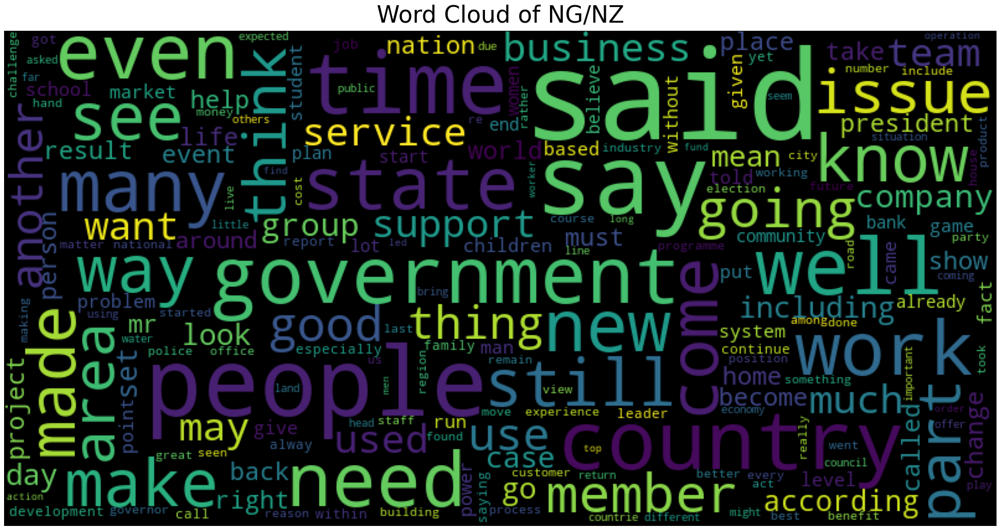

In [ ]:
plot_wordcloud(texts3, title="Word Cloud of NG/NZ")

### Logistic Regression

In [56]:
lr3 = LogisticRegressionCV().fit(dev_X3,y_dev3)
#scores_lr=cross_val_score(lr,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_lr.mean())
print("Auucuracy score on test data:",lr3.score(test_X3,y_test3))

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


Auucuracy score on test data: 0.9803364649333625


In [ ]:
y_hat_lr3 = lr3.predict(test_X3)

cm  = metrics.confusion_matrix(y_test3,y_hat_lr3)
print(cm)
print(classification_report(y_test3,y_hat_lr3, digits=4))

[[1659   61]
 [  19 2457]]
              precision    recall  f1-score   support

           0     0.9887    0.9645    0.9765      1720
           1     0.9758    0.9923    0.9840      2476

    accuracy                         0.9809      4196
   macro avg     0.9822    0.9784    0.9802      4196
weighted avg     0.9811    0.9809    0.9809      4196



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


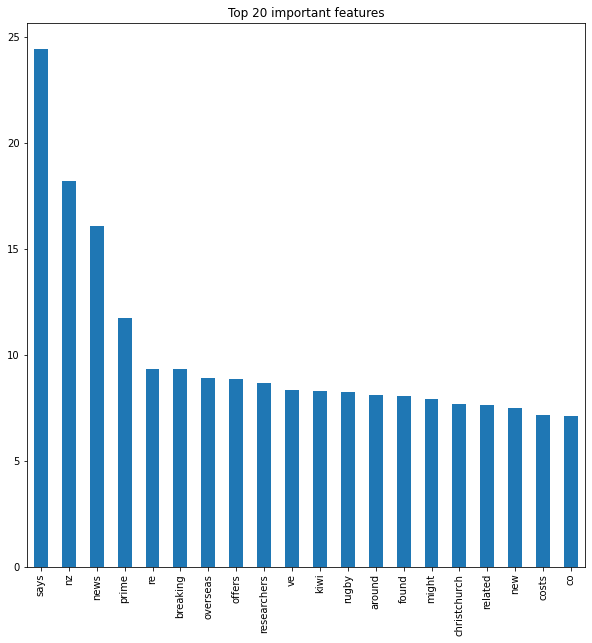

In [ ]:
feat_importances = pd.Series(lr3.coef_[0], index=vector3.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance3_lr.xlsx")

In [57]:
ca_X=vector3.transform(ca_t)
ca_pred_lr = lr3.predict(ca_X)

cm  = metrics.confusion_matrix(ca_level,ca_pred_lr)
print(cm)
print("CA:",classification_report(ca_level,ca_pred_lr, digits=4))

us_X=vector3.transform(us_t)
us_pred_lr = lr3.predict(us_X)

cm  = metrics.confusion_matrix(us_level,us_pred_lr)
print(cm)
print("US:",classification_report(us_level,us_pred_lr, digits=4))

sg_X=vector3.transform(sg_t)
sg_pred_lr = lr3.predict(sg_X)

cm  = metrics.confusion_matrix(sg_level,sg_pred_lr)
print(cm)
print("SG:",classification_report(sg_level,sg_pred_lr, digits=4))

ph_X=vector3.transform(ph_t)
ph_pred_lr = lr3.predict(ph_X)

cm  = metrics.confusion_matrix(ph_level,ph_pred_lr)
print(cm)
print("PH:",classification_report(ph_level,ph_pred_lr, digits=4))

#nz_X=vector2.transform(nz_t)
#nz_pred_lr = lr2.predict(nz_X)

#cm  = metrics.confusion_matrix(nz_level,nz_pred_lr)
#print(cm)
#print("NZ:",classification_report(nz_level,nz_pred_lr, digits=4))

#ng_X=vector2.transform(ng_t)
#ng_pred_lr = lr2.predict(ng_X)

#cm  = metrics.confusion_matrix(ng_level,ng_pred_lr)
#print(cm)
#print("NG:",classification_report(ng_level,ng_pred_lr, digits=4))

ie_X=vector3.transform(ie_t)
ie_pred_lr = lr3.predict(ie_X)

cm  = metrics.confusion_matrix(ie_level,ie_pred_lr)
print(cm)
print("IE:",classification_report(ie_level,ie_pred_lr, digits=4))

bd_X=vector3.transform(bd_t)
bd_pred_lr = lr3.predict(bd_X)

cm  = metrics.confusion_matrix(bd_level,bd_pred_lr)
print(cm)
print("BD:",classification_report(bd_level,bd_pred_lr, digits=4))

au_X=vector3.transform(au_t)
au_pred_lr = lr3.predict(au_X)

cm  = metrics.confusion_matrix(au_level,au_pred_lr)
print(cm)
print("AU:",classification_report(au_level,au_pred_lr, digits=4))

ke_X=vector3.transform(ke_t)
ke_pred_lr = lr3.predict(ke_X)

cm  = metrics.confusion_matrix(ke_level,ke_pred_lr)
print(cm)
print("KE:",classification_report(ke_level,ke_pred_lr, digits=4))

gb_X=vector3.transform(gb_t)
gb_pred_lr = lr3.predict(gb_X)

cm  = metrics.confusion_matrix(gb_level,gb_pred_lr)
print(cm)
print("GB:",classification_report(gb_level,gb_pred_lr, digits=4))


[[    0     0]
 [  411 10982]]
CA:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9639    0.9816     11393

    accuracy                         0.9639     11393
   macro avg     0.5000    0.4820    0.4908     11393
weighted avg     1.0000    0.9639    0.9816     11393



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[  970 10433]
 [    0     0]]
US:               precision    recall  f1-score   support

           0     1.0000    0.0851    0.1568     11403
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.0851     11403
   macro avg     0.5000    0.0425    0.0784     11403
weighted avg     1.0000    0.0851    0.1568     11403



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [ 1656 13568]]
SG:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.8912    0.9425     15224

    accuracy                         0.8912     15224
   macro avg     0.5000    0.4456    0.4712     15224
weighted avg     1.0000    0.8912    0.9425     15224



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[ 3155 11284]
 [    0     0]]
PH:               precision    recall  f1-score   support

           0     1.0000    0.2185    0.3586     14439
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.2185     14439
   macro avg     0.5000    0.1093    0.1793     14439
weighted avg     1.0000    0.2185    0.3586     14439



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [ 1118 13730]]
IE:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9247    0.9609     14848

    accuracy                         0.9247     14848
   macro avg     0.5000    0.4624    0.4804     14848
weighted avg     1.0000    0.9247    0.9609     14848



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[6081 7881]
 [   0    0]]
BD:               precision    recall  f1-score   support

           0     1.0000    0.4355    0.6068     13962
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.4355     13962
   macro avg     0.5000    0.2178    0.3034     13962
weighted avg     1.0000    0.4355    0.6068     13962



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [  301 12362]]
AU:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9762    0.9880     12663

    accuracy                         0.9762     12663
   macro avg     0.5000    0.4881    0.4940     12663
weighted avg     1.0000    0.9762    0.9880     12663



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[10312  9039]
 [    0     0]]
KE:               precision    recall  f1-score   support

           0     1.0000    0.5329    0.6953     19351
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.5329     19351
   macro avg     0.5000    0.2664    0.3476     19351
weighted avg     1.0000    0.5329    0.6953     19351



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [  848 13809]]
GB:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9421    0.9702     14657

    accuracy                         0.9421     14657
   macro avg     0.5000    0.4711    0.4851     14657
weighted avg     1.0000    0.9421    0.9702     14657



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
pred3=pd.concat([df,df2,df6,df_test])
texts_=list(pred3.text_no_sw)
texts_ = [str(text).replace("<br />"," ") for text in texts_]
texts_ = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts_]

texts_=[text.lower() for text in texts_]
texts_=[text.replace("ottawa"," ") for text in texts_]
texts_=[text.replace("toronto"," ")  for text in texts_]
texts_=[text.replace("ontario"," ")  for text in texts_]
texts_=[text.replace("singapore"," ")  for text in texts_]
level_=pred3.target

_X =  vector3.transform(texts_)   

y_pred_lr = lr3.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_lr)
print(cm)
print(classification_report(level_,y_pred_lr, digits=4))

[[19414 35308]
 [14525 61684]]
              precision    recall  f1-score   support

         0.0     0.5720    0.3548    0.4379     54722
         1.0     0.6360    0.8094    0.7123     76209

    accuracy                         0.6194    130931
   macro avg     0.6040    0.5821    0.5751    130931
weighted avg     0.6092    0.6194    0.5976    130931



### Random Forest

In [58]:
rf3 = RandomForestClassifier().fit(dev_X3,y_dev3)
#scores_rf=cross_val_score(rf,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_rf.mean())
print("Auucuracy score on test data:",rf3.score(test_X3,y_test3))

Auucuracy score on test data: 0.9602359624207997


In [ ]:
y_hat_rf3 = rf3.predict(test_X3)
cm  = metrics.confusion_matrix(y_test3,y_hat_rf3)
print(cm)
print(classification_report(y_test3,y_hat_rf3, digits=4))

[[1564  156]
 [  28 2448]]
              precision    recall  f1-score   support

           0     0.9824    0.9093    0.9444      1720
           1     0.9401    0.9887    0.9638      2476

    accuracy                         0.9561      4196
   macro avg     0.9613    0.9490    0.9541      4196
weighted avg     0.9574    0.9561    0.9559      4196



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


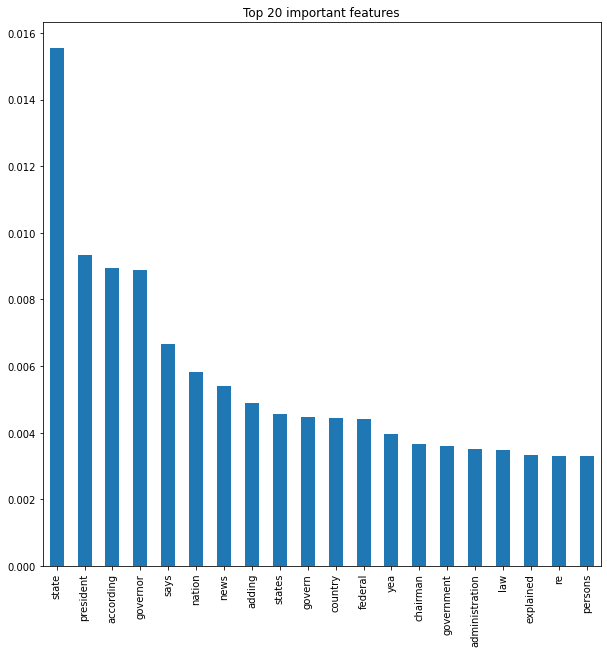

In [ ]:
feat_importances = pd.Series(rf3.feature_importances_, index=vector3.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance3_rf.xlsx")

In [63]:
#ca_X=vector3.transform(ca_t)
ca_pred_rf = rf3.predict(ca_X)

cm  = metrics.confusion_matrix(ca_level,ca_pred_rf)
print(cm)
print("CA:",classification_report(ca_level,ca_pred_rf, digits=4))

#us_X=vector3.transform(us_t)
us_pred_rf = rf3.predict(us_X)

cm  = metrics.confusion_matrix(us_level,us_pred_rf)
print(cm)
print("US:",classification_report(us_level,us_pred_rf, digits=4))

#sg_X=vector3.transform(sg_t)
sg_pred_rf = rf3.predict(sg_X)

cm  = metrics.confusion_matrix(sg_level,sg_pred_rf)
print(cm)
print("SG:",classification_report(sg_level,sg_pred_rf, digits=4))

#ph_X=vector3.transform(ph_t)
ph_pred_rf = rf3.predict(ph_X)

cm  = metrics.confusion_matrix(ph_level,ph_pred_rf)
print(cm)
print("PH:",classification_report(ph_level,ph_pred_rf, digits=4))

#nz_X=vector2.transform(nz_t)
#nz_pred_lr = lr2.predict(nz_X)

#cm  = metrics.confusion_matrix(nz_level,nz_pred_lr)
#print(cm)
#print("NZ:",classification_report(nz_level,nz_pred_lr, digits=4))

#ng_X=vector2.transform(ng_t)
#ng_pred_lr = lr2.predict(ng_X)

#cm  = metrics.confusion_matrix(ng_level,ng_pred_lr)
#print(cm)
#print("NG:",classification_report(ng_level,ng_pred_lr, digits=4))

#ie_X=vector3.transform(ie_t)
ie_pred_rf = rf3.predict(ie_X)

cm  = metrics.confusion_matrix(ie_level,ie_pred_rf)
print(cm)
print("IE:",classification_report(ie_level,ie_pred_rf, digits=4))

#bd_X=vector3.transform(bd_t)
bd_pred_rf = rf3.predict(bd_X)

cm  = metrics.confusion_matrix(bd_level,bd_pred_rf)
print(cm)
print("BD:",classification_report(bd_level,bd_pred_rf, digits=4))

#au_X=vector3.transform(au_t)
au_pred_rf = rf3.predict(au_X)

cm  = metrics.confusion_matrix(au_level,au_pred_rf)
print(cm)
print("AU:",classification_report(au_level,au_pred_rf, digits=4))

#ke_X=vector3.transform(ke_t)
ke_pred_rf = rf3.predict(ke_X)

cm  = metrics.confusion_matrix(ke_level,ke_pred_rf)
print(cm)
print("KE:",classification_report(ke_level,ke_pred_rf, digits=4))

#gb_X=vector3.transform(gb_t)
gb_pred_rf = rf3.predict(gb_X)

cm  = metrics.confusion_matrix(gb_level,gb_pred_rf)
print(cm)
print("GB:",classification_report(gb_level,gb_pred_rf, digits=4))

[[    0     0]
 [  625 10768]]
CA:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9451    0.9718     11393

    accuracy                         0.9451     11393
   macro avg     0.5000    0.4726    0.4859     11393
weighted avg     1.0000    0.9451    0.9718     11393



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[1406 9997]
 [   0    0]]
US:               precision    recall  f1-score   support

           0     1.0000    0.1233    0.2195     11403
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.1233     11403
   macro avg     0.5000    0.0617    0.1098     11403
weighted avg     1.0000    0.1233    0.2195     11403



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [ 1282 13942]]
SG:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9158    0.9560     15224

    accuracy                         0.9158     15224
   macro avg     0.5000    0.4579    0.4780     15224
weighted avg     1.0000    0.9158    0.9560     15224



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[ 2136 12303]
 [    0     0]]
PH:               precision    recall  f1-score   support

           0     1.0000    0.1479    0.2577     14439
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.1479     14439
   macro avg     0.5000    0.0740    0.1289     14439
weighted avg     1.0000    0.1479    0.2577     14439



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [ 1320 13528]]
IE:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9111    0.9535     14848

    accuracy                         0.9111     14848
   macro avg     0.5000    0.4555    0.4767     14848
weighted avg     1.0000    0.9111    0.9535     14848



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[5551 8411]
 [   0    0]]
BD:               precision    recall  f1-score   support

           0     1.0000    0.3976    0.5690     13962
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.3976     13962
   macro avg     0.5000    0.1988    0.2845     13962
weighted avg     1.0000    0.3976    0.5690     13962



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [  722 11941]]
AU:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9430    0.9707     12663

    accuracy                         0.9430     12663
   macro avg     0.5000    0.4715    0.4853     12663
weighted avg     1.0000    0.9430    0.9707     12663



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[ 8349 11002]
 [    0     0]]
KE:               precision    recall  f1-score   support

           0     1.0000    0.4315    0.6028     19351
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.4315     19351
   macro avg     0.5000    0.2157    0.3014     19351
weighted avg     1.0000    0.4315    0.6028     19351



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [ 1134 13523]]
GB:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9226    0.9598     14657

    accuracy                         0.9226     14657
   macro avg     0.5000    0.4613    0.4799     14657
weighted avg     1.0000    0.9226    0.9598     14657



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
y_pred_rf = rf3.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_rf)
print(cm)
print(classification_report(level_,y_pred_rf, digits=4))

[[16034 38688]
 [12297 63912]]
              precision    recall  f1-score   support

         0.0     0.5660    0.2930    0.3861     54722
         1.0     0.6229    0.8386    0.7149     76209

    accuracy                         0.6106    130931
   macro avg     0.5944    0.5658    0.5505    130931
weighted avg     0.5991    0.6106    0.5775    130931



### SVM

svc = SVC().fit(dev_X,y_dev)
#scores_svc=cross_val_score(svc,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_svc.mean())
print("Auucuracy score on test data:",svc.score(test_X,y_test))

y_hat = svc.predict(test_X)
cm  = metrics.confusion_matrix(y_test,y_hat)
print(cm)
print(classification_report(y_test,y_hat, digits=4))

### XGB

In [ ]:
xgb_cl3 = xgb.XGBClassifier().fit(dev_X3,y_dev3)
#scores_xgb=cross_val_score(xgb_cl,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_xgb.mean())
print("Auucuracy score on test data:",xgb_cl3.score(test_X3,y_test3))

y_hat_xgb3 = xgb_cl3.predict(test_X3)
cm  = metrics.confusion_matrix(y_test3,y_hat_xgb3)
print(cm)
print(classification_report(y_test3,y_hat_xgb3, digits=4))

Auucuracy score on test data: 0.930648236415634
[[1500  220]
 [  71 2405]]
              precision    recall  f1-score   support

           0     0.9548    0.8721    0.9116      1720
           1     0.9162    0.9713    0.9430      2476

    accuracy                         0.9306      4196
   macro avg     0.9355    0.9217    0.9273      4196
weighted avg     0.9320    0.9306    0.9301      4196



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


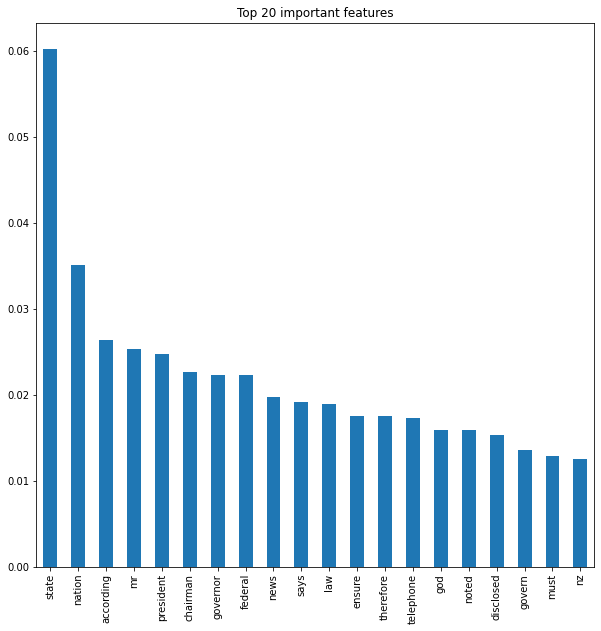

In [ ]:
feat_importances = pd.Series(xgb_cl3.feature_importances_, index=vector3.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance3_xgb.xlsx")

In [ ]:
y_pred_xgb = xgb_cl3.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_xgb)
print(cm)
print(classification_report(level_,y_pred_xgb, digits=4))

[[14654 40068]
 [14561 61648]]
              precision    recall  f1-score   support

         0.0     0.5016    0.2678    0.3492     54722
         1.0     0.6061    0.8089    0.6930     76209

    accuracy                         0.5828    130931
   macro avg     0.5538    0.5384    0.5211    130931
weighted avg     0.5624    0.5828    0.5493    130931



## IE vs. BD dev_X6, y_dev6

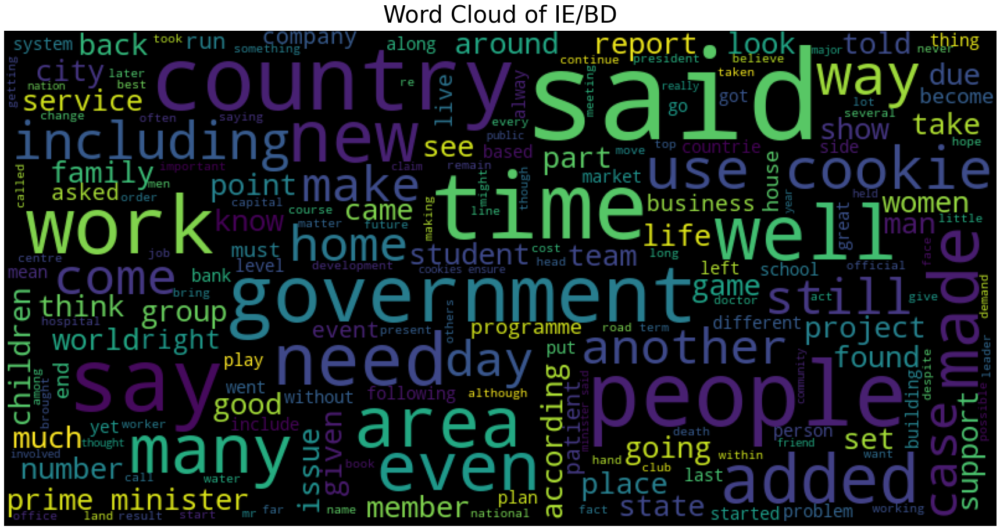

In [ ]:
plot_wordcloud(texts6, title="Word Cloud of IE/BD")

### Logistic Regression

In [64]:
lr6 = LogisticRegressionCV().fit(dev_X6,y_dev6)
#scores_lr=cross_val_score(lr,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_lr.mean())
print("Auucuracy score on test data:",lr6.score(test_X6,y_test6))

y_hat_lr6 = lr6.predict(test_X6)

cm  = metrics.confusion_matrix(y_test6,y_hat_lr6)
print(cm)
print(classification_report(y_test6,y_hat_lr6, digits=4))

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


Auucuracy score on test data: 0.9784796945505033
[[2684   76]
 [  48 2954]]
              precision    recall  f1-score   support

           0     0.9824    0.9725    0.9774      2760
           1     0.9749    0.9840    0.9794      3002

    accuracy                         0.9785      5762
   macro avg     0.9787    0.9782    0.9784      5762
weighted avg     0.9785    0.9785    0.9785      5762



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


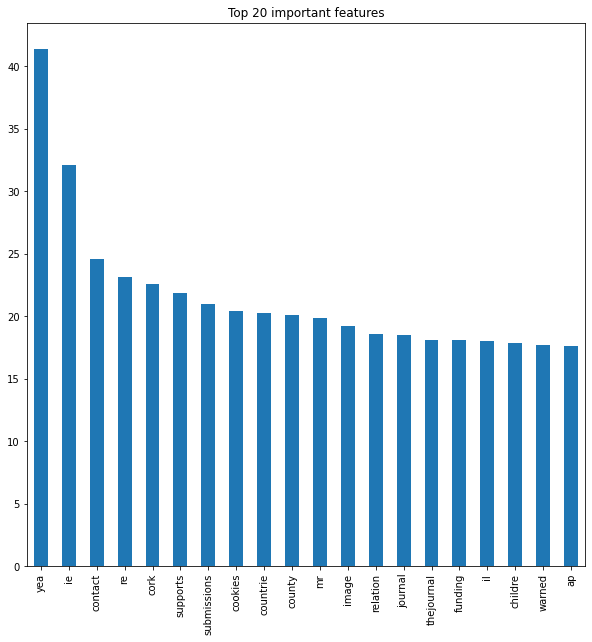

In [ ]:
feat_importances = pd.Series(lr6.coef_[0], index=vector6.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance4_lr.xlsx")

In [65]:
ca_X=vector6.transform(ca_t)
ca_pred_lr = lr6.predict(ca_X)

cm  = metrics.confusion_matrix(ca_level,ca_pred_lr)
print(cm)
print("CA:",classification_report(ca_level,ca_pred_lr, digits=4))

us_X=vector6.transform(us_t)
us_pred_lr = lr6.predict(us_X)

cm  = metrics.confusion_matrix(us_level,us_pred_lr)
print(cm)
print("US:",classification_report(us_level,us_pred_lr, digits=4))

sg_X=vector6.transform(sg_t)
sg_pred_lr = lr6.predict(sg_X)

cm  = metrics.confusion_matrix(sg_level,sg_pred_lr)
print(cm)
print("SG:",classification_report(sg_level,sg_pred_lr, digits=4))

ph_X=vector6.transform(ph_t)
ph_pred_lr = lr6.predict(ph_X)

cm  = metrics.confusion_matrix(ph_level,ph_pred_lr)
print(cm)
print("PH:",classification_report(ph_level,ph_pred_lr, digits=4))

nz_X=vector6.transform(nz_t)
nz_pred_lr = lr6.predict(nz_X)

cm  = metrics.confusion_matrix(nz_level,nz_pred_lr)
print(cm)
print("NZ:",classification_report(nz_level,nz_pred_lr, digits=4))

ng_X=vector6.transform(ng_t)
ng_pred_lr = lr6.predict(ng_X)

cm  = metrics.confusion_matrix(ng_level,ng_pred_lr)
print(cm)
print("NG:",classification_report(ng_level,ng_pred_lr, digits=4))

#ie_X=vector3.transform(ie_t)
#ie_pred_lr = lr3.predict(ie_X)

#cm  = metrics.confusion_matrix(ie_level,ie_pred_lr)
#print(cm)
#print("IE:",classification_report(ie_level,ie_pred_lr, digits=4))

#bd_X=vector3.transform(bd_t)
#bd_pred_lr = lr3.predict(bd_X)

#cm  = metrics.confusion_matrix(bd_level,bd_pred_lr)
#print(cm)
#print("BD:",classification_report(bd_level,bd_pred_lr, digits=4))

au_X=vector6.transform(au_t)
au_pred_lr = lr6.predict(au_X)

cm  = metrics.confusion_matrix(au_level,au_pred_lr)
print(cm)
print("AU:",classification_report(au_level,au_pred_lr, digits=4))

ke_X=vector6.transform(ke_t)
ke_pred_lr = lr6.predict(ke_X)

cm  = metrics.confusion_matrix(ke_level,ke_pred_lr)
print(cm)
print("KE:",classification_report(ke_level,ke_pred_lr, digits=4))

gb_X=vector6.transform(gb_t)
gb_pred_lr = lr6.predict(gb_X)

cm  = metrics.confusion_matrix(gb_level,gb_pred_lr)
print(cm)
print("GB:",classification_report(gb_level,gb_pred_lr, digits=4))


[[   0    0]
 [1765 9628]]
CA:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.8451    0.9160     11393

    accuracy                         0.8451     11393
   macro avg     0.5000    0.4225    0.4580     11393
weighted avg     1.0000    0.8451    0.9160     11393



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[2529 8874]
 [   0    0]]
US:               precision    recall  f1-score   support

           0     1.0000    0.2218    0.3630     11403
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.2218     11403
   macro avg     0.5000    0.1109    0.1815     11403
weighted avg     1.0000    0.2218    0.3630     11403



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[   0    0]
 [6068 9156]]
SG:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.6014    0.7511     15224

    accuracy                         0.6014     15224
   macro avg     0.5000    0.3007    0.3756     15224
weighted avg     1.0000    0.6014    0.7511     15224



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[5962 8477]
 [   0    0]]
PH:               precision    recall  f1-score   support

           0     1.0000    0.4129    0.5845     14439
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.4129     14439
   macro avg     0.5000    0.2065    0.2922     14439
weighted avg     1.0000    0.4129    0.5845     14439



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [ 2483 10993]]
NZ:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.8157    0.8985     13476

    accuracy                         0.8157     13476
   macro avg     0.5000    0.4079    0.4493     13476
weighted avg     1.0000    0.8157    0.8985     13476



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[6748 2661]
 [   0    0]]
NG:               precision    recall  f1-score   support

           0     1.0000    0.7172    0.8353      9409
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.7172      9409
   macro avg     0.5000    0.3586    0.4177      9409
weighted avg     1.0000    0.7172    0.8353      9409



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [ 1411 11252]]
AU:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.8886    0.9410     12663

    accuracy                         0.8886     12663
   macro avg     0.5000    0.4443    0.4705     12663
weighted avg     1.0000    0.8886    0.9410     12663



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[11743  7608]
 [    0     0]]
KE:               precision    recall  f1-score   support

           0     1.0000    0.6068    0.7553     19351
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.6068     19351
   macro avg     0.5000    0.3034    0.3777     19351
weighted avg     1.0000    0.6068    0.7553     19351



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [ 1642 13015]]
GB:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.8880    0.9407     14657

    accuracy                         0.8880     14657
   macro avg     0.5000    0.4440    0.4703     14657
weighted avg     1.0000    0.8880    0.9407     14657



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
pred4=pd.concat([df,df2,df3,df_test])
texts_=list(pred4.text_no_sw)
texts_ = [str(text).replace("<br />"," ") for text in texts_]
texts_ = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts_]
texts_=[text.lower() for text in texts_]
texts_=[text.replace("ottawa"," ") for text in texts_]
texts_=[text.replace("toronto"," ")  for text in texts_]
texts_=[text.replace("singapore"," ")  for text in texts_]
texts_=[text.replace("ontario"," ")  for text in texts_]
level_=pred4.target


_X =  vector6.transform(texts_)   

y_pred_lr = lr6.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_lr)
print(cm)
print(classification_report(level_,y_pred_lr, digits=4))

[[23605 27548]
 [20609 54834]]
              precision    recall  f1-score   support

         0.0     0.5339    0.4615    0.4950     51153
         1.0     0.6656    0.7268    0.6949     75443

    accuracy                         0.6196    126596
   macro avg     0.5997    0.5941    0.5950    126596
weighted avg     0.6124    0.6196    0.6141    126596



### Random Forest

In [66]:
rf6 = RandomForestClassifier().fit(dev_X6,y_dev6)
#scores_rf=cross_val_score(rf,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_rf.mean())
print("Auucuracy score on test data:",rf6.score(test_X6,y_test6))
y_hat_rf6 = rf6.predict(test_X6)
cm  = metrics.confusion_matrix(y_test6,y_hat_rf6)
print(cm)
print(classification_report(y_test6,y_hat_rf6, digits=4))

Auucuracy score on test data: 0.9461992363762582
[[2641  119]
 [ 191 2811]]
              precision    recall  f1-score   support

           0     0.9326    0.9569    0.9446      2760
           1     0.9594    0.9364    0.9477      3002

    accuracy                         0.9462      5762
   macro avg     0.9460    0.9466    0.9462      5762
weighted avg     0.9465    0.9462    0.9462      5762



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


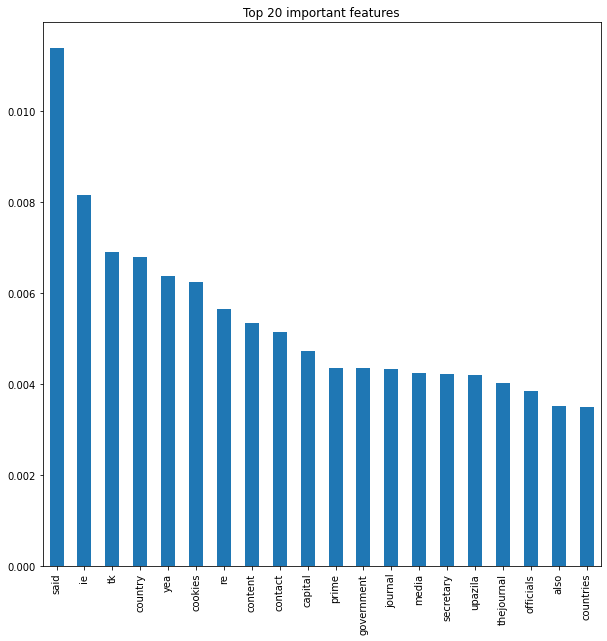

In [ ]:
feat_importances = pd.Series(rf6.feature_importances_, index=vector6.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance4_rf.xlsx")

In [67]:
#ca_X=vector3.transform(ca_t)
ca_pred_rf = rf6.predict(ca_X)

cm  = metrics.confusion_matrix(ca_level,ca_pred_rf)
print(cm)
print("CA:",classification_report(ca_level,ca_pred_rf, digits=4))

#us_X=vector3.transform(us_t)
us_pred_rf = rf6.predict(us_X)

cm  = metrics.confusion_matrix(us_level,us_pred_rf)
print(cm)
print("US:",classification_report(us_level,us_pred_rf, digits=4))

#sg_X=vector3.transform(sg_t)
sg_pred_rf = rf6.predict(sg_X)

cm  = metrics.confusion_matrix(sg_level,sg_pred_rf)
print(cm)
print("SG:",classification_report(sg_level,sg_pred_rf, digits=4))

#ph_X=vector3.transform(ph_t)
ph_pred_rf = rf6.predict(ph_X)

cm  = metrics.confusion_matrix(ph_level,ph_pred_rf)
print(cm)
print("PH:",classification_report(ph_level,ph_pred_rf, digits=4))

#nz_X=vector2.transform(nz_t)
nz_pred_rf = rf6.predict(nz_X)

cm  = metrics.confusion_matrix(nz_level,nz_pred_rf)
print(cm)
print("NZ:",classification_report(nz_level,nz_pred_rf, digits=4))

#ng_X=vector2.transform(ng_t)
ng_pred_rf = rf6.predict(ng_X)

cm  = metrics.confusion_matrix(ng_level,ng_pred_rf)
print(cm)
print("NG:",classification_report(ng_level,ng_pred_rf, digits=4))

#ie_X=vector3.transform(ie_t)
#ie_pred_rf = rf6.predict(ie_X)

#cm  = metrics.confusion_matrix(ie_level,ie_pred_rf)
#print(cm)
#print("IE:",classification_report(ie_level,ie_pred_rf, digits=4))

#bd_X=vector3.transform(bd_t)
#bd_pred_rf = rf3.predict(bd_X)

#cm  = metrics.confusion_matrix(bd_level,bd_pred_rf)
#print(cm)
#print("BD:",classification_report(bd_level,bd_pred_rf, digits=4))

#au_X=vector3.transform(au_t)
au_pred_rf = rf6.predict(au_X)

cm  = metrics.confusion_matrix(au_level,au_pred_rf)
print(cm)
print("AU:",classification_report(au_level,au_pred_rf, digits=4))

#ke_X=vector3.transform(ke_t)
ke_pred_rf = rf6.predict(ke_X)

cm  = metrics.confusion_matrix(ke_level,ke_pred_rf)
print(cm)
print("KE:",classification_report(ke_level,ke_pred_rf, digits=4))

#gb_X=vector3.transform(gb_t)
gb_pred_rf = rf6.predict(gb_X)

cm  = metrics.confusion_matrix(gb_level,gb_pred_rf)
print(cm)
print("GB:",classification_report(gb_level,gb_pred_rf, digits=4))

[[   0    0]
 [2670 8723]]
CA:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.7656    0.8673     11393

    accuracy                         0.7656     11393
   macro avg     0.5000    0.3828    0.4336     11393
weighted avg     1.0000    0.7656    0.8673     11393



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[3633 7770]
 [   0    0]]
US:               precision    recall  f1-score   support

           0     1.0000    0.3186    0.4832     11403
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.3186     11403
   macro avg     0.5000    0.1593    0.2416     11403
weighted avg     1.0000    0.3186    0.4832     11403



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[   0    0]
 [6859 8365]]
SG:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.5495    0.7092     15224

    accuracy                         0.5495     15224
   macro avg     0.5000    0.2747    0.3546     15224
weighted avg     1.0000    0.5495    0.7092     15224



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[6854 7585]
 [   0    0]]
PH:               precision    recall  f1-score   support

           0     1.0000    0.4747    0.6438     14439
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.4747     14439
   macro avg     0.5000    0.2373    0.3219     14439
weighted avg     1.0000    0.4747    0.6438     14439



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[   0    0]
 [4059 9417]]
NZ:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.6988    0.8227     13476

    accuracy                         0.6988     13476
   macro avg     0.5000    0.3494    0.4113     13476
weighted avg     1.0000    0.6988    0.8227     13476



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[7668 1741]
 [   0    0]]
NG:               precision    recall  f1-score   support

           0     1.0000    0.8150    0.8981      9409
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.8150      9409
   macro avg     0.5000    0.4075    0.4490      9409
weighted avg     1.0000    0.8150    0.8981      9409



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[   0    0]
 [2757 9906]]
AU:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.7823    0.8778     12663

    accuracy                         0.7823     12663
   macro avg     0.5000    0.3911    0.4389     12663
weighted avg     1.0000    0.7823    0.8778     12663



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[13393  5958]
 [    0     0]]
KE:               precision    recall  f1-score   support

           0     1.0000    0.6921    0.8180     19351
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.6921     19351
   macro avg     0.5000    0.3461    0.4090     19351
weighted avg     1.0000    0.6921    0.8180     19351



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [ 3191 11466]]
GB:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.7823    0.8778     14657

    accuracy                         0.7823     14657
   macro avg     0.5000    0.3911    0.4389     14657
weighted avg     1.0000    0.7823    0.8778     14657



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
y_pred_rf = rf6.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_rf)
print(cm)
print(classification_report(level_,y_pred_rf, digits=4))

[[29085 22068]
 [27312 48131]]
              precision    recall  f1-score   support

         0.0     0.5157    0.5686    0.5409     51153
         1.0     0.6856    0.6380    0.6609     75443

    accuracy                         0.6099    126596
   macro avg     0.6007    0.6033    0.6009    126596
weighted avg     0.6170    0.6099    0.6124    126596



### XGB

In [ ]:
xgb_cl6 = xgb.XGBClassifier().fit(dev_X6,y_dev6)
#scores_xgb=cross_val_score(xgb_cl,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_xgb.mean())
print("Auucuracy score on test data:",xgb_cl6.score(test_X6,y_test6))

y_hat_xgb6 = xgb_cl6.predict(test_X6)
cm  = metrics.confusion_matrix(y_test6,y_hat_xgb6)
print(cm)
print(classification_report(y_test6,y_hat_xgb6, digits=4))

Auucuracy score on test data: 0.9134900256764764
[[2195  209]
 [ 229 2430]]
              precision    recall  f1-score   support

           0     0.9055    0.9131    0.9093      2404
           1     0.9208    0.9139    0.9173      2659

    accuracy                         0.9135      5063
   macro avg     0.9132    0.9135    0.9133      5063
weighted avg     0.9136    0.9135    0.9135      5063



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


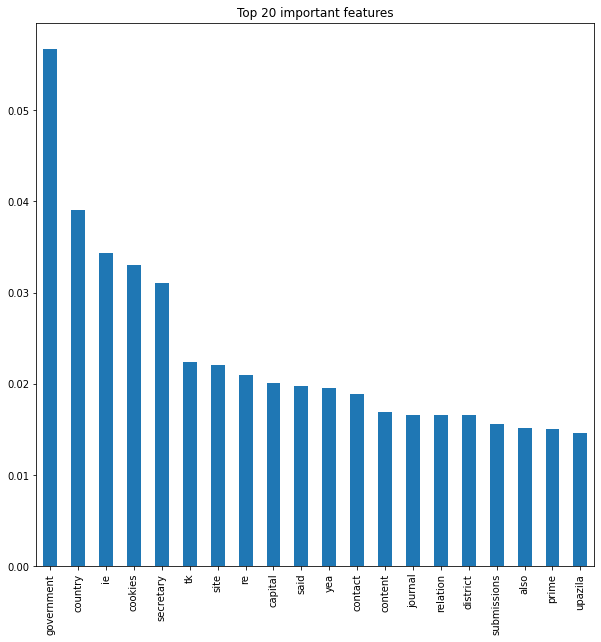

In [ ]:
feat_importances = pd.Series(xgb_cl6.feature_importances_, index=vector6.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance4_xgb.xlsx")

In [ ]:
y_pred_xgb = xgb_cl6.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_xgb)
print(cm)
print(classification_report(level_,y_pred_xgb, digits=4))

[[23276 27877]
 [26405 49038]]
              precision    recall  f1-score   support

         0.0     0.4685    0.4550    0.4617     51153
         1.0     0.6376    0.6500    0.6437     75443

    accuracy                         0.5712    126596
   macro avg     0.5530    0.5525    0.5527    126596
weighted avg     0.5693    0.5712    0.5702    126596



## Eight Countries dev_X7, y_dev7

### Logistic Regression

lr7 = LogisticRegressionCV().fit(dev_X7,y_dev7)
#scores_lr=cross_val_score(lr,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_lr.mean())
print("Auucuracy score on test data:",lr7.score(test_X7,y_test7))

y_hat_lr7 = lr7.predict(test_X7)

cm  = metrics.confusion_matrix(y_test7,y_hat_lr7)
print(cm)
print(classification_report(y_test7,y_hat_lr7, digits=4))

feat_importances = pd.Series(lr7.feature_importances_, index=vector7.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

### Random Forest

rf7 = RandomForestClassifier().fit(dev_X7,y_dev7)
#scores_rf=cross_val_score(rf,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_rf.mean())
print("Auucuracy score on test data:",rf7.score(test_X7,y_test7))

y_hat_rf7 = rf7.predict(test_X7)
cm  = metrics.confusion_matrix(y_test7,y_hat_rf7)
print(cm)
print(classification_report(y_test7,y_hat_rf7, digits=4))

feat_importances = pd.Series(rf7.feature_importances_, index=vector7.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

### SVM

svc = SVC().fit(dev_X,y_dev)
#scores_svc=cross_val_score(svc,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_svc.mean())
print("Auucuracy score on test data:",svc.score(test_X,y_test))

y_hat = svc.predict(test_X)
cm  = metrics.confusion_matrix(y_test,y_hat)
print(cm)
print(classification_report(y_test,y_hat, digits=4))

### XGBoost


xgb_cl7 = xgb.XGBClassifier().fit(dev_X7,y_dev7)
#scores_xgb=cross_val_score(xgb_cl,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_xgb.mean())
print("Auucuracy score on test data:",xgb_cl7.score(test_X7,y_test7))

y_hat_xgb7 = xgb_cl7.predict(test_X7)
cm  = metrics.confusion_matrix(y_test7,y_hat_xgb7)
print(cm)
print(classification_report(y_test7,y_hat_xgb7, digits=4))

feat_importances = pd.Series(xgb_cl7.feature_importances_, index=vector7.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

# Eight Countries

In [68]:
eight=pd.concat([df,df2,df6,df3])
texts=list(eight.text_no_sw)
texts = [str(text).replace("<br />"," ") for text in texts]
texts = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts]

texts=[text.lower() for text in texts]
texts=[text.replace("ottawa"," ") for text in texts]
texts=[text.replace("toronto"," ")  for text in texts]
texts=[text.replace("ontario"," ")  for text in texts]
texts=[text.replace("singapore"," ")  for text in texts]
level=eight.target

In [69]:
X_dev8,X_test8,y_dev8,y_test8=train_test_split(texts,level,
                                          test_size=0.2,random_state=42)

#for i in range(len(X_dev2)):
#    X_dev2[i] = stem(X_dev2[i])

#for i in range(len(X_test2)):
#    X_test2[i] = stem(X_test2[i])
  

#X_dev2=[text.lower() for text in X_dev2]
#X_test2=[text.lower() for text in X_test2]    
    
vector = TfidfVectorizer()
vector8=vector.fit(X_dev8)
dev_X8 = vector8.transform(X_dev8)
test_X8 =  vector8.transform(X_test8)

## Logistiic Regression

In [70]:
lr8 = LogisticRegressionCV().fit(dev_X8,y_dev8)
#scores_lr=cross_val_score(lr,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_lr.mean())
print("Auucuracy score on test data:",lr8.score(test_X8,y_test8))

y_hat_lr8 = lr8.predict(test_X8)

cm  = metrics.confusion_matrix(y_test8,y_hat_lr8)
print(cm)
print(classification_report(y_test8,y_hat_lr8, digits=4))

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


Auucuracy score on test data: 0.9240554942153522
[[ 8974   901]
 [  681 10275]]
              precision    recall  f1-score   support

           0     0.9295    0.9088    0.9190      9875
           1     0.9194    0.9378    0.9285     10956

    accuracy                         0.9241     20831
   macro avg     0.9244    0.9233    0.9238     20831
weighted avg     0.9242    0.9241    0.9240     20831



/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


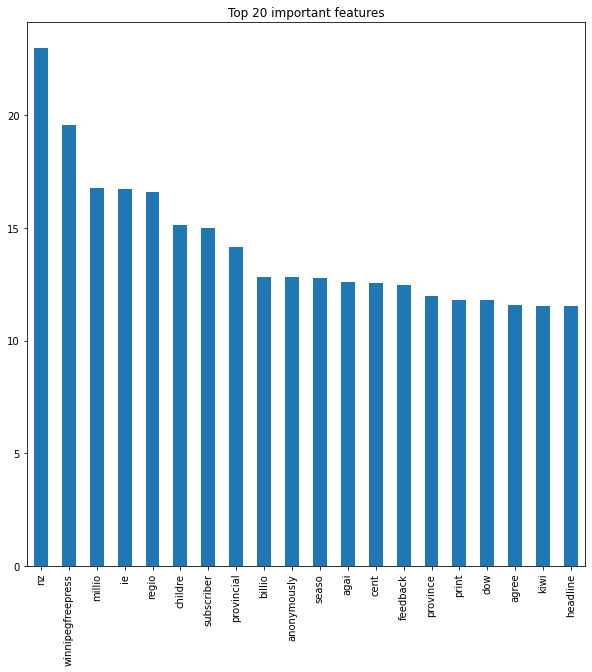

In [ ]:
feat_importances = pd.Series(lr8.coef_[0], index=vector8.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance8_lr.xlsx")

In [72]:
au_X=vector8.transform(au_t)
au_pred_lr = lr8.predict(au_X)

cm  = metrics.confusion_matrix(au_level,au_pred_lr)
print(cm)
print("AU:",classification_report(au_level,au_pred_lr, digits=4))

ke_X=vector8.transform(ke_t)
ke_pred_lr = lr8.predict(ke_X)

cm  = metrics.confusion_matrix(ke_level,ke_pred_lr)
print(cm)
print("KE:",classification_report(ke_level,ke_pred_lr, digits=4))

gb_X=vector8.transform(gb_t)
gb_pred_lr = lr8.predict(gb_X)

cm  = metrics.confusion_matrix(gb_level,gb_pred_lr)
print(cm)
print("GB:",classification_report(gb_level,gb_pred_lr, digits=4))


[[    0     0]
 [ 1880 10783]]
AU:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.8515    0.9198     12663

    accuracy                         0.8515     12663
   macro avg     0.5000    0.4258    0.4599     12663
weighted avg     1.0000    0.8515    0.9198     12663



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[11518  7833]
 [    0     0]]
KE:               precision    recall  f1-score   support

           0     1.0000    0.5952    0.7463     19351
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.5952     19351
   macro avg     0.5000    0.2976    0.3731     19351
weighted avg     1.0000    0.5952    0.7463     19351



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [ 2661 11996]]
GB:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.8184    0.9002     14657

    accuracy                         0.8184     14657
   macro avg     0.5000    0.4092    0.4501     14657
weighted avg     1.0000    0.8184    0.9002     14657



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
pred8=df_test
texts_=list(pred8.text_no_sw)
texts_ = [str(text).replace("<br />"," ") for text in texts_]
texts_ = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts_]
texts_=[text.lower() for text in texts_]
texts_=[text.replace("ottawa"," ") for text in texts_]
texts_=[text.replace("toronto"," ")  for text in texts_]
texts_=[text.replace("singapore"," ")  for text in texts_]
texts_=[text.replace("ontario"," ")  for text in texts_]
level_=pred8.target


_X =  vector8.transform(texts_)   

y_pred_lr = lr8.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_lr)
print(cm)
print(classification_report(level_,y_pred_lr, digits=4))

[[10787  7409]
 [14069 24456]]
              precision    recall  f1-score   support

         0.0     0.4340    0.5928    0.5011     18196
         1.0     0.7675    0.6348    0.6949     38525

    accuracy                         0.6213     56721
   macro avg     0.6007    0.6138    0.5980     56721
weighted avg     0.6605    0.6213    0.6327     56721



## Random Forest

In [73]:
rf8 = RandomForestClassifier().fit(dev_X8,y_dev8)
#scores_rf=cross_val_score(rf,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_rf.mean())
print("Auucuracy score on test data:",rf8.score(test_X8,y_test8))
y_hat_rf8 = rf8.predict(test_X8)
cm  = metrics.confusion_matrix(y_test8,y_hat_rf8)
print(cm)
print(classification_report(y_test8,y_hat_rf8, digits=4))

Auucuracy score on test data: 0.8698574240314916
[[ 7604  2271]
 [  440 10516]]
              precision    recall  f1-score   support

           0     0.9453    0.7700    0.8487      9875
           1     0.8224    0.9598    0.8858     10956

    accuracy                         0.8699     20831
   macro avg     0.8838    0.8649    0.8673     20831
weighted avg     0.8807    0.8699    0.8682     20831



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


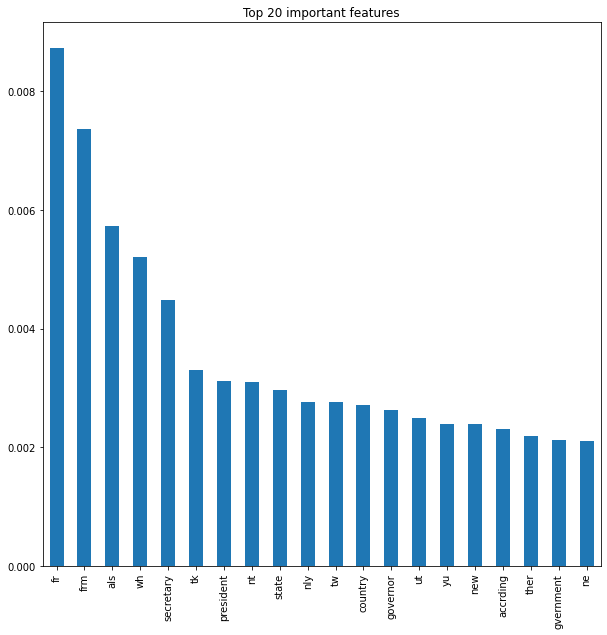

In [ ]:
feat_importances = pd.Series(rf8.feature_importances_, index=vector8.get_feature_names())
feat_importances.nlargest(200).to_excel("importance8_rf.xlsx")
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()


In [74]:
#au_X=vector3.transform(au_t)
au_pred_rf = rf8.predict(au_X)

cm  = metrics.confusion_matrix(au_level,au_pred_rf)
print(cm)
print("AU:",classification_report(au_level,au_pred_rf, digits=4))

#ke_X=vector3.transform(ke_t)
ke_pred_rf = rf8.predict(ke_X)

cm  = metrics.confusion_matrix(ke_level,ke_pred_rf)
print(cm)
print("KE:",classification_report(ke_level,ke_pred_rf, digits=4))

#gb_X=vector3.transform(gb_t)
gb_pred_rf = rf8.predict(gb_X)

cm  = metrics.confusion_matrix(gb_level,gb_pred_rf)
print(cm)
print("GB:",classification_report(gb_level,gb_pred_rf, digits=4))

[[    0     0]
 [  857 11806]]
AU:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9323    0.9650     12663

    accuracy                         0.9323     12663
   macro avg     0.5000    0.4662    0.4825     12663
weighted avg     1.0000    0.9323    0.9650     12663



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[ 8920 10431]
 [    0     0]]
KE:               precision    recall  f1-score   support

           0     1.0000    0.4610    0.6310     19351
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.4610     19351
   macro avg     0.5000    0.2305    0.3155     19351
weighted avg     1.0000    0.4610    0.6310     19351



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0]
 [ 1434 13223]]
GB:               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     1.0000    0.9022    0.9486     14657

    accuracy                         0.9022     14657
   macro avg     0.5000    0.4511    0.4743     14657
weighted avg     1.0000    0.9022    0.9486     14657



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
y_pred_rf = rf8.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_rf)
print(cm)
print(classification_report(level_,y_pred_rf, digits=4))

[[ 8163 10033]
 [ 9332 29193]]
              precision    recall  f1-score   support

         0.0     0.4666    0.4486    0.4574     18196
         1.0     0.7442    0.7578    0.7509     38525

    accuracy                         0.6586     56721
   macro avg     0.6054    0.6032    0.6042     56721
weighted avg     0.6552    0.6586    0.6568     56721



## XGB

In [ ]:
xgb_cl8 = xgb.XGBClassifier().fit(dev_X8,y_dev8)
#scores_xgb=cross_val_score(xgb_cl,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_xgb.mean())
print("Auucuracy score on test data:",xgb_cl8.score(test_X8,y_test8))

y_hat_xgb8 = xgb_cl8.predict(test_X8)
cm  = metrics.confusion_matrix(y_test8,y_hat_xgb8)
print(cm)
print(classification_report(y_test8,y_hat_xgb8, digits=4))

Auucuracy score on test data: 0.830224282941557
[[6259 2654]
 [ 495 9140]]
              precision    recall  f1-score   support

           0     0.9267    0.7022    0.7990      8913
           1     0.7750    0.9486    0.8530      9635

    accuracy                         0.8302     18548
   macro avg     0.8508    0.8254    0.8260     18548
weighted avg     0.8479    0.8302    0.8271     18548



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


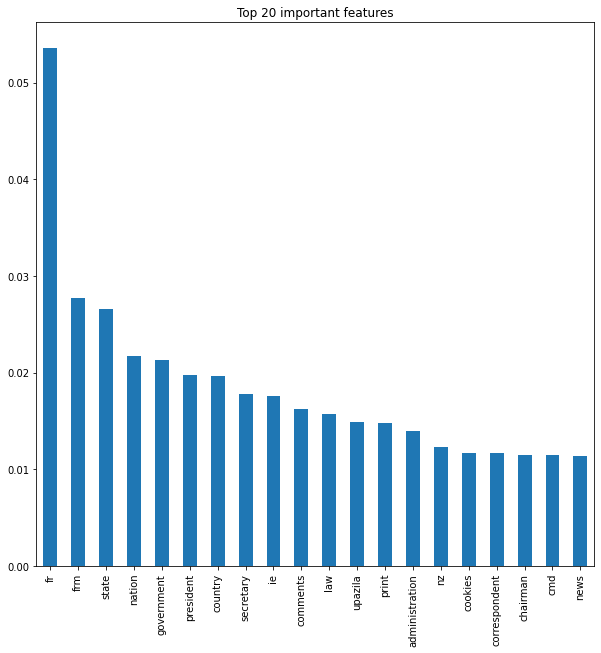

In [ ]:
feat_importances = pd.Series(xgb_cl8.feature_importances_, index=vector8.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance8_xgb.xlsx")

In [ ]:
y_pred_xgb = xgb_cl8.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_xgb)
print(cm)
print(classification_report(level_,y_pred_xgb, digits=4))

[[ 6305 11891]
 [ 8611 29914]]
              precision    recall  f1-score   support

         0.0     0.4227    0.3465    0.3808     18196
         1.0     0.7156    0.7765    0.7448     38525

    accuracy                         0.6385     56721
   macro avg     0.5691    0.5615    0.5628     56721
weighted avg     0.6216    0.6385    0.6280     56721



In [ ]:
plot_wordcloud(texts, title="Word Cloud of Eight Countries")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Try NZ, NG, IE, BD

In [ ]:
data=pd.concat([df6,df3])
texts=list(data.text_no_sw)
texts = [str(text).replace("<br />"," ") for text in texts]
texts = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts]

texts=[text.lower() for text in texts]
texts=[text.replace("ottawa"," ") for text in texts]
texts=[text.replace("toronto"," ")  for text in texts]
texts=[text.replace("ontario"," ")  for text in texts]
texts=[text.replace("singapore"," ")  for text in texts]
level=data.target

In [ ]:
X_dev9,X_test9,y_dev9,y_test9=train_test_split(texts,level,
                                          test_size=0.2,random_state=42)

#for i in range(len(X_dev2)):
#    X_dev2[i] = stem(X_dev2[i])

#for i in range(len(X_test2)):
#    X_test2[i] = stem(X_test2[i])
  

#X_dev2=[text.lower() for text in X_dev2]
#X_test2=[text.lower() for text in X_test2]    
    
vector = TfidfVectorizer()
vector9=vector.fit(X_dev9)
dev_X9 = vector9.transform(X_dev9)
test_X9 =  vector9.transform(X_test9)

### Logistic Regression

In [ ]:
lr9 = LogisticRegressionCV().fit(dev_X9,y_dev9)
#scores_lr=cross_val_score(lr,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_lr.mean())
#print("Auucuracy score on test data:",lr8.score(test_X8,y_test8))

y_hat_lr9 = lr9.predict(test_X9)

cm  = metrics.confusion_matrix(y_test9,y_hat_lr9)
print(cm)
print(classification_report(y_test9,y_hat_lr9, digits=4))

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[[3990  177]
 [ 119 4931]]
              precision    recall  f1-score   support

           0     0.9710    0.9575    0.9642      4167
           1     0.9653    0.9764    0.9709      5050

    accuracy                         0.9679      9217
   macro avg     0.9682    0.9670    0.9675      9217
weighted avg     0.9679    0.9679    0.9679      9217



/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


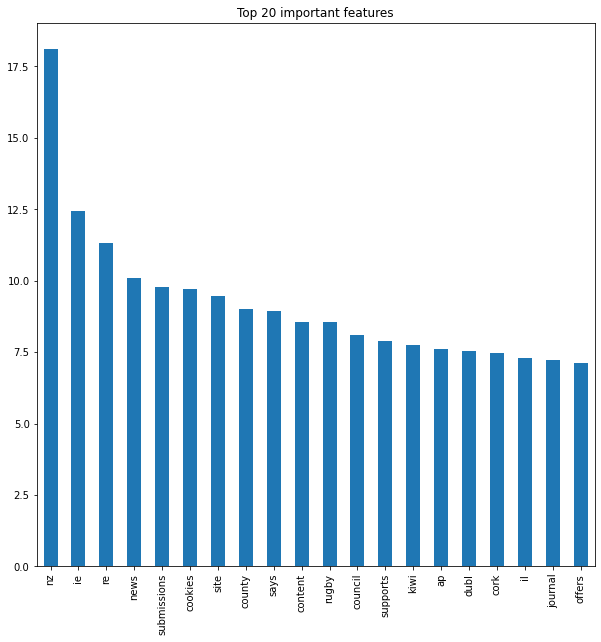

In [ ]:
feat_importances = pd.Series(lr9.coef_[0], index=vector9.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance9_lr.xlsx")

In [ ]:
pred9=pd.concat([df,df2,df_test])
texts_=list(pred9.text_no_sw)
texts_ = [str(text).replace("<br />"," ") for text in texts_]
texts_ = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts_]
texts_=[text.lower() for text in texts_]
texts_=[text.replace("ottawa"," ") for text in texts_]
texts_=[text.replace("toronto"," ")  for text in texts_]
texts_=[text.replace("singapore"," ")  for text in texts_]
texts_=[text.replace("ontario"," ")  for text in texts_]
level_=pred9.target


_X =  vector9.transform(texts_)   

y_pred_lr = lr9.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_lr)
print(cm)
print(classification_report(level_,y_pred_lr, digits=4))

[[18916 23406]
 [17214 46168]]
              precision    recall  f1-score   support

           0     0.5236    0.4470    0.4822     42322
           1     0.6636    0.7284    0.6945     63382

    accuracy                         0.6157    105704
   macro avg     0.5936    0.5877    0.5884    105704
weighted avg     0.6075    0.6157    0.6095    105704



### Random Forest

In [ ]:
rf9 = RandomForestClassifier().fit(dev_X9,y_dev9)
#scores_rf=cross_val_score(rf,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_rf.mean())
print("Auucuracy score on test data:",rf9.score(test_X9,y_test9))
y_hat_rf9 = rf9.predict(test_X9)
cm  = metrics.confusion_matrix(y_test9,y_hat_rf9)
print(cm)
print(classification_report(y_test9,y_hat_rf9, digits=4))

Auucuracy score on test data: 0.9343604209612673
[[3773  394]
 [ 211 4839]]
              precision    recall  f1-score   support

           0     0.9470    0.9054    0.9258      4167
           1     0.9247    0.9582    0.9412      5050

    accuracy                         0.9344      9217
   macro avg     0.9359    0.9318    0.9335      9217
weighted avg     0.9348    0.9344    0.9342      9217



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


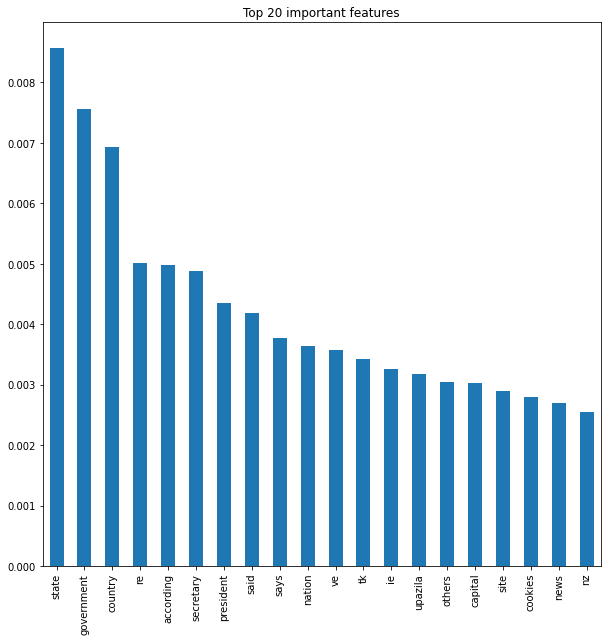

In [ ]:
feat_importances = pd.Series(rf9.feature_importances_, index=vector9.get_feature_names())
feat_importances.nlargest(200).to_excel("importance9_rf.xlsx")
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()


In [ ]:
y_pred_rf = rf9.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_rf)
print(cm)
print(classification_report(level_,y_pred_rf, digits=4))

[[17840 24482]
 [16621 46761]]
              precision    recall  f1-score   support

           0     0.5177    0.4215    0.4647     42322
           1     0.6564    0.7378    0.6947     63382

    accuracy                         0.6112    105704
   macro avg     0.5870    0.5796    0.5797    105704
weighted avg     0.6008    0.6112    0.6026    105704



### XGB

In [ ]:
xgb_cl9 = xgb.XGBClassifier().fit(dev_X9,y_dev9)
#scores_xgb=cross_val_score(xgb_cl,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_xgb.mean())
print("Auucuracy score on test data:",xgb_cl9.score(test_X9,y_test9))

y_hat_xgb9 = xgb_cl9.predict(test_X9)
cm  = metrics.confusion_matrix(y_test9,y_hat_xgb9)
print(cm)
print(classification_report(y_test9,y_hat_xgb9, digits=4))

Auucuracy score on test data: 0.8857545839210155
[[3475  692]
 [ 361 4689]]
              precision    recall  f1-score   support

           0     0.9059    0.8339    0.8684      4167
           1     0.8714    0.9285    0.8991      5050

    accuracy                         0.8858      9217
   macro avg     0.8886    0.8812    0.8837      9217
weighted avg     0.8870    0.8858    0.8852      9217



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


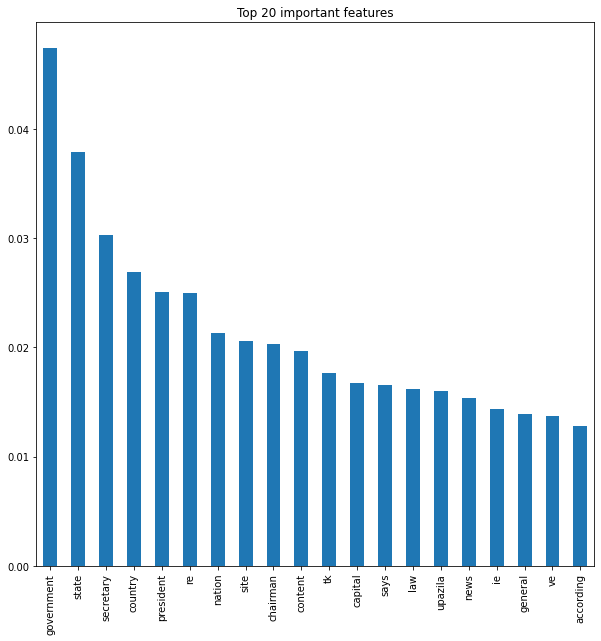

In [ ]:
feat_importances = pd.Series(xgb_cl9.feature_importances_, index=vector9.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance9_xgb.xlsx")

In [ ]:
y_pred_xgb = xgb_cl9.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_xgb)
print(cm)
print(classification_report(level_,y_pred_xgb, digits=4))

[[14248 28074]
 [16307 47075]]
              precision    recall  f1-score   support

           0     0.4663    0.3367    0.3910     42322
           1     0.6264    0.7427    0.6796     63382

    accuracy                         0.5801    105704
   macro avg     0.5464    0.5397    0.5353    105704
weighted avg     0.5623    0.5801    0.5641    105704



## Try SG,PH,NZ,NG,IE,BD

In [ ]:
data=pd.concat([df6,df3,df2])
texts=list(data.text_no_sw)
texts = [str(text).replace("<br />"," ") for text in texts]
texts = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts]

texts=[text.lower() for text in texts]
texts=[text.replace("ottawa"," ") for text in texts]
texts=[text.replace("toronto"," ")  for text in texts]
texts=[text.replace("ontario"," ")  for text in texts]
texts=[text.replace("singapore"," ")  for text in texts]
level=data.target

In [ ]:
X_dev9,X_test9,y_dev9,y_test9=train_test_split(texts,level,
                                          test_size=0.2,random_state=42)

#for i in range(len(X_dev2)):
#    X_dev2[i] = stem(X_dev2[i])

#for i in range(len(X_test2)):
#    X_test2[i] = stem(X_test2[i])
  

#X_dev2=[text.lower() for text in X_dev2]
#X_test2=[text.lower() for text in X_test2]    
    
vector = TfidfVectorizer()
vector9=vector.fit(X_dev9)
dev_X9 = vector9.transform(X_dev9)
test_X9 =  vector9.transform(X_test9)

### Logistic Regression

In [ ]:
lr9 = LogisticRegressionCV().fit(dev_X9,y_dev9)
#scores_lr=cross_val_score(lr,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_lr.mean())
#print("Auucuracy score on test data:",lr8.score(test_X8,y_test8))

y_hat_lr9 = lr9.predict(test_X9)

cm  = metrics.confusion_matrix(y_test9,y_hat_lr9)
print(cm)
print(classification_report(y_test9,y_hat_lr9, digits=4))

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[[6536  271]
 [ 160 7518]]
              precision    recall  f1-score   support

           0     0.9761    0.9602    0.9681      6807
           1     0.9652    0.9792    0.9721      7678

    accuracy                         0.9702     14485
   macro avg     0.9707    0.9697    0.9701     14485
weighted avg     0.9703    0.9702    0.9702     14485



/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


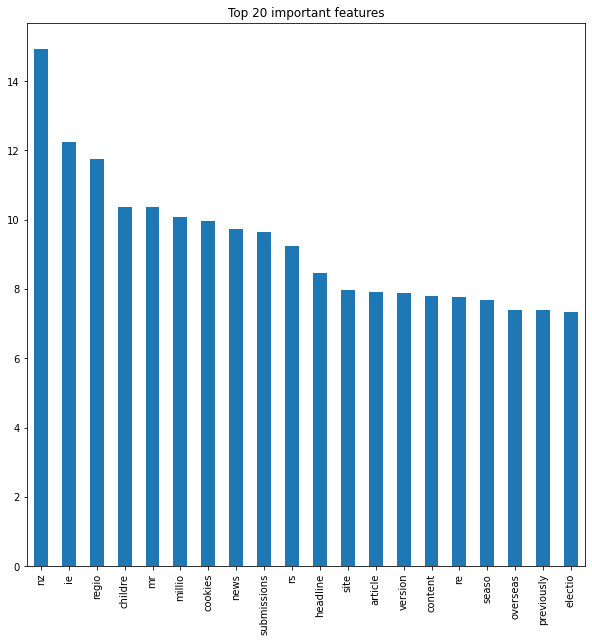

In [ ]:
feat_importances = pd.Series(lr9.coef_[0], index=vector9.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance10_lr.xlsx")

In [ ]:
pred10=pd.concat([df,df_test])
texts_=list(pred10.text_no_sw)
texts_ = [str(text).replace("<br />"," ") for text in texts_]
texts_ = [re.sub(r"\b[a-zA-Z]\b", "", text) for text in texts_]
texts_=[text.lower() for text in texts_]
texts_=[text.replace("ottawa"," ") for text in texts_]
texts_=[text.replace("toronto"," ")  for text in texts_]
texts_=[text.replace("singapore"," ")  for text in texts_]
texts_=[text.replace("ontario"," ")  for text in texts_]
level_=pred10.target


_X =  vector9.transform(texts_)   

y_pred_lr = lr9.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_lr)
print(cm)
print(classification_report(level_,y_pred_lr, digits=4))

[[ 9366 19769]
 [10830 39401]]
              precision    recall  f1-score   support

           0     0.4638    0.3215    0.3797     29135
           1     0.6659    0.7844    0.7203     50231

    accuracy                         0.6145     79366
   macro avg     0.5648    0.5529    0.5500     79366
weighted avg     0.5917    0.6145    0.5953     79366



### Random Forest

In [ ]:
rf9 = RandomForestClassifier().fit(dev_X9,y_dev9)
#scores_rf=cross_val_score(rf,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_rf.mean())
print("Auucuracy score on test data:",rf9.score(test_X9,y_test9))
y_hat_rf9 = rf9.predict(test_X9)
cm  = metrics.confusion_matrix(y_test9,y_hat_rf9)
print(cm)
print(classification_report(y_test9,y_hat_rf9, digits=4))

Auucuracy score on test data: 0.9279944770452192
[[5919  888]
 [ 155 7523]]
              precision    recall  f1-score   support

           0     0.9745    0.8695    0.9190      6807
           1     0.8944    0.9798    0.9352      7678

    accuracy                         0.9280     14485
   macro avg     0.9345    0.9247    0.9271     14485
weighted avg     0.9320    0.9280    0.9276     14485



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


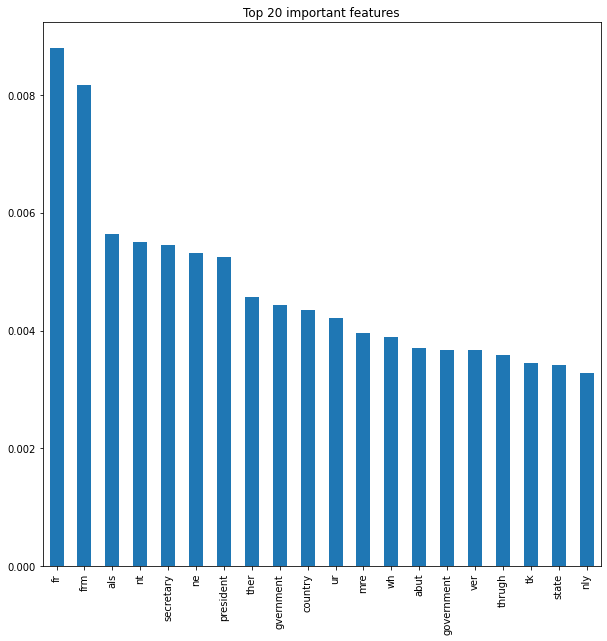

In [ ]:
feat_importances = pd.Series(rf9.feature_importances_, index=vector9.get_feature_names())
feat_importances.nlargest(200).to_excel("importance10_rf.xlsx")
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()


In [ ]:
y_pred_rf = rf9.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_rf)
print(cm)
print(classification_report(level_,y_pred_rf, digits=4))

[[ 7368 21767]
 [ 7434 42797]]
              precision    recall  f1-score   support

           0     0.4978    0.2529    0.3354     29135
           1     0.6629    0.8520    0.7456     50231

    accuracy                         0.6321     79366
   macro avg     0.5803    0.5524    0.5405     79366
weighted avg     0.6023    0.6321    0.5950     79366



### XGB

In [ ]:
xgb_cl9 = xgb.XGBClassifier().fit(dev_X9,y_dev9)
#scores_xgb=cross_val_score(xgb_cl,dev_X,y_dev,cv=3)
#print("Auucuracy score on development data:",scores_xgb.mean())
print("Auucuracy score on test data:",xgb_cl9.score(test_X9,y_test9))

y_hat_xgb9 = xgb_cl9.predict(test_X9)
cm  = metrics.confusion_matrix(y_test9,y_hat_xgb9)
print(cm)
print(classification_report(y_test9,y_hat_xgb9, digits=4))

Auucuracy score on test data: 0.8874007594062824
[[5458 1349]
 [ 282 7396]]
              precision    recall  f1-score   support

           0     0.9509    0.8018    0.8700      6807
           1     0.8457    0.9633    0.9007      7678

    accuracy                         0.8874     14485
   macro avg     0.8983    0.8825    0.8853     14485
weighted avg     0.8951    0.8874    0.8863     14485



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


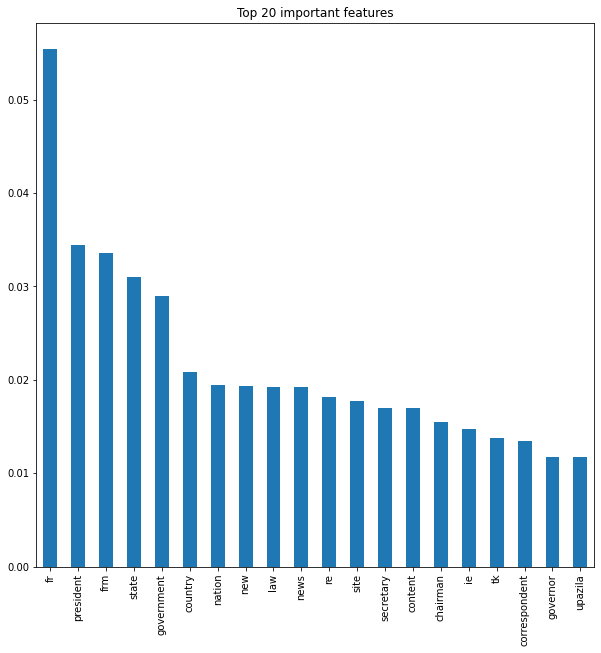

In [ ]:
feat_importances = pd.Series(xgb_cl9.feature_importances_, index=vector9.get_feature_names())
feat_importances.nlargest(20).plot(kind='bar',figsize=(10,10))
plt.title("Top 20 important features")
plt.show()

In [ ]:
feat_importances.nlargest(200).to_excel("importance10_xgb.xlsx")

In [ ]:
y_pred_xgb = xgb_cl9.predict(_X)

cm  = metrics.confusion_matrix(level_,y_pred_xgb)
print(cm)
print(classification_report(level_,y_pred_xgb, digits=4))

[[ 6562 22573]
 [ 6987 43244]]
              precision    recall  f1-score   support

           0     0.4843    0.2252    0.3075     29135
           1     0.6570    0.8609    0.7453     50231

    accuracy                         0.6275     79366
   macro avg     0.5707    0.5431    0.5264     79366
weighted avg     0.5936    0.6275    0.5846     79366

